# 1. Environment Setup & Warning Suppression

In [1]:
import warnings
from sklearn.exceptions import ConvergenceWarning
warnings.filterwarnings("ignore", category=ConvergenceWarning)
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.simplefilter(action='ignore', category=UserWarning)


#  2. Library Imports & Tools Initialization

In [2]:

import itertools
import numpy as np
import pandas as pd
import os
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from PIL import Image
from sklearn.metrics import classification_report, f1_score , confusion_matrix



# 3. Deep Learning Framework Setup & Mixed Precision Configuration

In [3]:
import tensorflow as tf
from tensorflow.keras.layers import Dense, Dropout, BatchNormalization, Rescaling, RandomFlip, RandomRotation, RandomZoom
from tensorflow.keras.optimizers import Adam
from tensorflow.keras import layers, models, Model
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import Callback, EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from tensorflow.keras import mixed_precision

mixed_precision.set_global_policy('mixed_float16')

print(tf.__version__)


2025-07-09 23:27:35.525342: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1752103655.733644      18 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1752103655.790899      18 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


2.18.0


# 4. Data Loading & Exploration
## 4.1 Dataset Paths Definition

In [4]:
dataset = {
             "train_data" : "/kaggle/input/indian-birds/Birds_25/train",
             "valid_data" : "/kaggle/input/indian-birds/Birds_25/valid",
          }

## 4.2 Extracting Image Paths & Labels into DataFrames

In [5]:


all_data = []
for path in dataset.values():
    data = {"imgpath": [] , "labels": [] }
    category = os.listdir(path)

    for folder in category:
        folderpath = os.path.join(path , folder)
        filelist = os.listdir(folderpath)
        for file in filelist:
            fpath = os.path.join(folderpath, file)
            data["imgpath"].append(fpath)
            data["labels"].append(folder)
        
        
    all_data.append(data.copy())
    data.clear()

    
    
train_df = pd.DataFrame(all_data[0] , index=range(len(all_data[0]['imgpath'])))
valid_df = pd.DataFrame(all_data[1] , index=range(len(all_data[1]['imgpath'])))



## 4.3 Label Encoding for Model Compatibility

In [6]:


lb = LabelEncoder()
train_df['encoded_labels'] = lb.fit_transform(train_df['labels'])
valid_df['encoded_labels'] = lb.fit_transform(valid_df['labels'])

## 4.4 Creating a Test Set from Validation Data

In [7]:
df = pd.concat([train_df, valid_df], ignore_index=True)

# 2️⃣ First split: Test set (12%)
train_val_df, test_df = train_test_split(
    df,
    test_size=0.12,
    shuffle=True,
    random_state=124
)

# 3️⃣ Second split: Train vs Validation
val_fraction_of_remaining = 0.08 / 0.88  # ~0.0909

train_df, valid_df = train_test_split(
    train_val_df,
    test_size=val_fraction_of_remaining,
    shuffle=True,
    random_state=124
)

# 4️⃣ Reset indices
train_df = train_df.reset_index(drop=True)
valid_df = valid_df.reset_index(drop=True)
test_df = test_df.reset_index(drop=True)

# 5️⃣ Optional: Check sizes
print(f"Train samples: {len(train_df)}")
print(f"Validation samples: {len(valid_df)}")
print(f"Test samples: {len(test_df)}")


Train samples: 30000
Validation samples: 3000
Test samples: 4500


##  4.5 Visualizing Class Distribution in Training Data

In [8]:
import pandas as pd

TARGET_COUNT = 1200
all_classes = train_df['labels'].unique()

balanced_dataframes = []

for label in all_classes:
    subset = train_df[train_df['labels'] == label]
    count = len(subset)
    
    if count > TARGET_COUNT:
        
        balanced_subset = subset.sample(n=TARGET_COUNT, replace=False, random_state=42)
    else:
        
        balanced_subset = subset.sample(n=TARGET_COUNT, replace=True, random_state=42)
    
    balanced_dataframes.append(balanced_subset)


train_df = pd.concat(balanced_dataframes).reset_index(drop=True)

print("balanced dataset shape:", train_df.shape)
print(train_df['labels'].value_counts())


balanced dataset shape: (30000, 3)
labels
Indian-Grey-Hornbill         1200
White-Breasted-Waterhen      1200
Rufous-Treepie               1200
Sarus-Crane                  1200
Hoopoe                       1200
Indian-Pitta                 1200
Common-Rosefinch             1200
Jungle-Babbler               1200
Common-Tailorbird            1200
Cattle-Egret                 1200
House-Crow                   1200
Indian-Peacock               1200
Indian-Roller                1200
Northern-Lapwing             1200
White-Breasted-Kingfisher    1200
Ruddy-Shelduck               1200
Common-Myna                  1200
Common-Kingfisher            1200
Coppersmith-Barbet           1200
Asian-Green-Bee-Eater        1200
Forest-Wagtail               1200
White-Wagtail                1200
Brown-Headed-Barbet          1200
Gray-Wagtail                 1200
Red-Wattled-Lapwing          1200
Name: count, dtype: int64


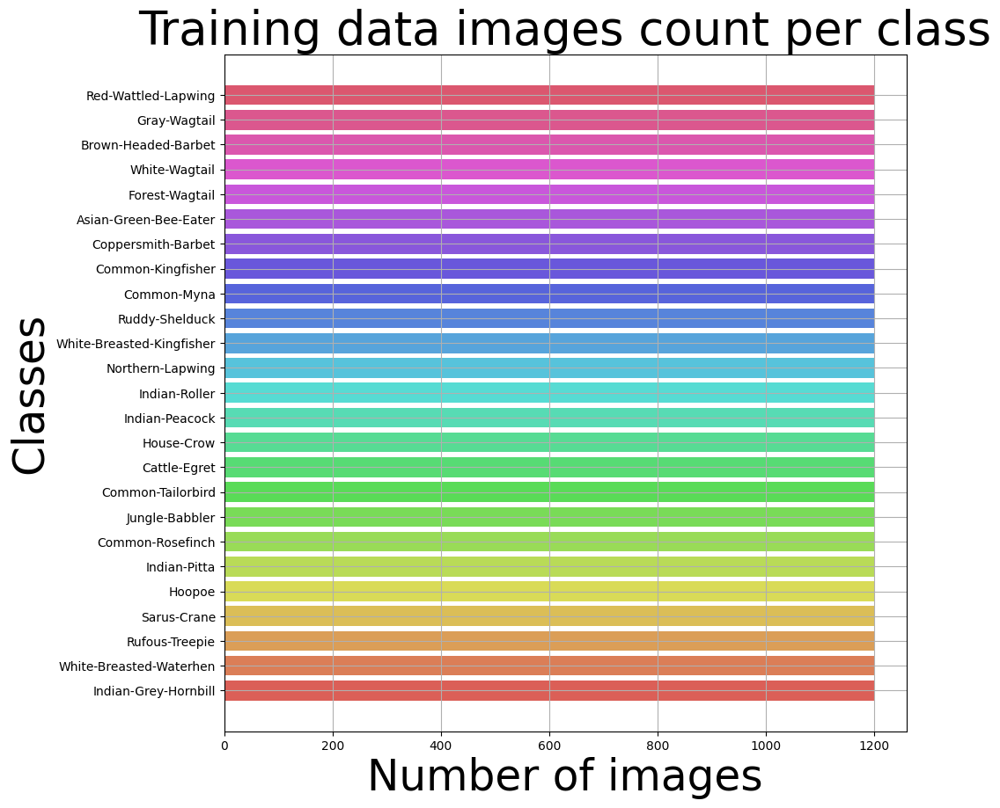

In [9]:
import matplotlib.pyplot as plt
import seaborn as sns

train = train_df["labels"].value_counts()
label = train.tolist()
index = train.index.tolist()


num_classes = len(index)
colors = sns.color_palette("hls", num_classes)  # hls = Hue-Lightness-Saturation 

plt.figure(figsize=(10, 10))
plt.title("Training data images count per class", fontsize=38)
plt.xlabel('Number of images', fontsize=35)
plt.ylabel('Classes', fontsize=35)
plt.barh(index, label, color=colors)
plt.grid(True)
plt.show()


##  4.6 Sampling & Inspecting Training Data

In [10]:
train_df.sample(n=15, random_state=1)

,imgpath,labels,encoded_labels
10747,/kaggle/input/indian-birds/Birds_25/train/Comm...,Common-Tailorbird,6
12573,/kaggle/input/indian-birds/Birds_25/train/Hous...,House-Crow,11
29676,/kaggle/input/indian-birds/Birds_25/train/Red-...,Red-Wattled-Lapwing,18
8856,/kaggle/input/indian-birds/Birds_25/train/Jung...,Jungle-Babbler,16
21098,/kaggle/input/indian-birds/Birds_25/valid/Comm...,Common-Kingfisher,3
17458,/kaggle/input/indian-birds/Birds_25/valid/Whit...,White-Breasted-Kingfisher,22
1476,/kaggle/input/indian-birds/Birds_25/valid/Whit...,White-Breasted-Waterhen,23
5120,/kaggle/input/indian-birds/Birds_25/train/Hoop...,Hoopoe,10
18338,/kaggle/input/indian-birds/Birds_25/train/Rudd...,Ruddy-Shelduck,19
28279,/kaggle/input/indian-birds/Birds_25/train/Gray...,Gray-Wagtail,9


## 4.7 Data Summary: Sample Records & Dataset Shapes

In [11]:
print("----------Train-------------")
print(train_df[["imgpath", "labels"]].head(5))
print(train_df.shape)
print("--------Validation----------")
print(valid_df[["imgpath", "labels"]].head(5))
print(valid_df.shape)
print("----------Test--------------")
print(test_df[["imgpath", "labels"]].head(5))
print(test_df.shape)

----------Train-------------
                                             imgpath                labels
0  /kaggle/input/indian-birds/Birds_25/valid/Indi...  Indian-Grey-Hornbill
1  /kaggle/input/indian-birds/Birds_25/train/Indi...  Indian-Grey-Hornbill
2  /kaggle/input/indian-birds/Birds_25/train/Indi...  Indian-Grey-Hornbill
3  /kaggle/input/indian-birds/Birds_25/train/Indi...  Indian-Grey-Hornbill
4  /kaggle/input/indian-birds/Birds_25/train/Indi...  Indian-Grey-Hornbill
(30000, 3)
--------Validation----------
                                             imgpath          labels
0  /kaggle/input/indian-birds/Birds_25/train/Hous...      House-Crow
1  /kaggle/input/indian-birds/Birds_25/valid/Rudd...  Ruddy-Shelduck
2  /kaggle/input/indian-birds/Birds_25/train/Catt...    Cattle-Egret
3  /kaggle/input/indian-birds/Birds_25/train/Comm...     Common-Myna
4  /kaggle/input/indian-birds/Birds_25/train/Indi...   Indian-Roller
(3000, 3)
----------Test--------------
                            

## 4.8 Image Preview from Validation Set

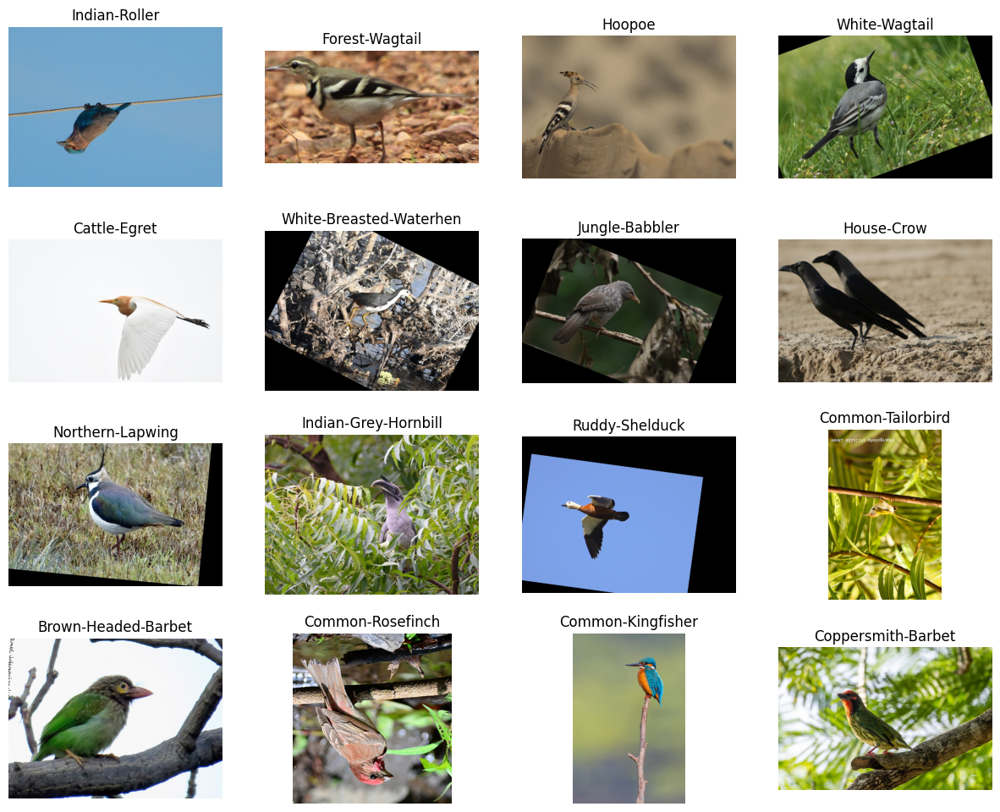

In [12]:
plt.figure(figsize=(15,12))
for i, row in valid_df.sample(n=16).reset_index().iterrows():
    plt.subplot(4,4,i+1)
    image_path = row['imgpath']
    image = Image.open(image_path)
    plt.imshow(image)
    plt.title(row["labels"])
    plt.axis('off')
plt.show()

# 5. Data Preprocessing & Augmentation
## 5.1 Image Resizing, Preprocessing & Data Generator Setup

In [13]:
%%time

BATCH_SIZE = 50
IMAGE_SIZE = (224, 224)


generator = ImageDataGenerator(
    preprocessing_function = tf.keras.applications.efficientnet.preprocess_input,
    
)


train_images = generator.flow_from_dataframe(
    dataframe=train_df,
    x_col='imgpath',
    y_col='labels',
    target_size=IMAGE_SIZE,
    color_mode='rgb',
    class_mode='categorical',
    batch_size=BATCH_SIZE,
    shuffle=True,
    seed=42,
)

val_images = generator.flow_from_dataframe(
    dataframe=valid_df,
    x_col='imgpath',
    y_col='labels',
    target_size=IMAGE_SIZE,
    color_mode='rgb',
    class_mode='categorical',
    batch_size=BATCH_SIZE,
    shuffle=False
)

test_images = generator.flow_from_dataframe(
    dataframe=test_df,
    x_col='imgpath',
    y_col='labels',
    target_size=IMAGE_SIZE,
    color_mode='rgb',
    class_mode='categorical',
    batch_size=BATCH_SIZE,
    shuffle=False
)

Found 30000 validated image filenames belonging to 25 classes.
Found 3000 validated image filenames belonging to 25 classes.
Found 4500 validated image filenames belonging to 25 classes.
CPU times: user 480 ms, sys: 940 ms, total: 1.42 s
Wall time: 1min 14s


## 5.2 Data Distribution Acrross Classes

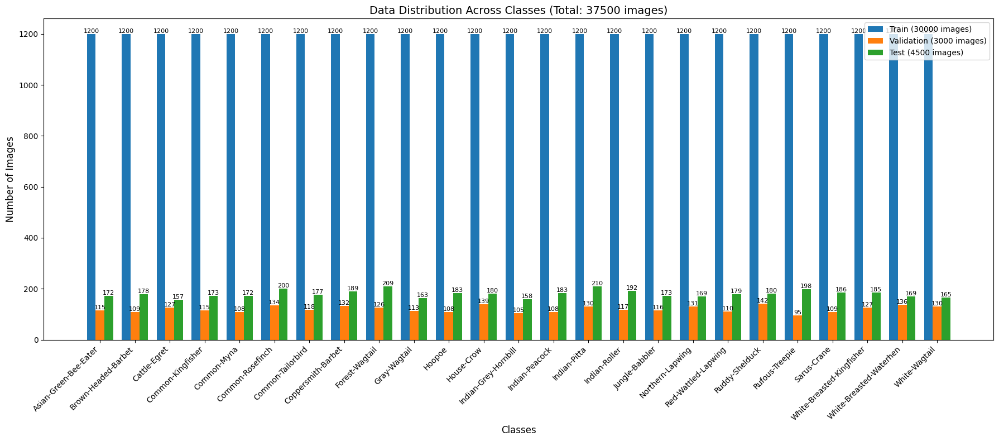

In [14]:
import matplotlib.pyplot as plt
import numpy as np


class_names = list(train_images.class_indices.keys())


train_counts = train_df['labels'].value_counts().sort_index()
val_counts = valid_df['labels'].value_counts().sort_index()
test_counts = test_df['labels'].value_counts().sort_index()


plt.figure(figsize=(18, 8))
bar_width = 0.25
index = np.arange(len(class_names))


train_bars = plt.bar(index - bar_width, train_counts, bar_width, 
                    label=f'Train ({len(train_df)} images)', color='#1f77b4')
val_bars = plt.bar(index, val_counts, bar_width, 
                  label=f'Validation ({len(valid_df)} images)', color='#ff7f0e')
test_bars = plt.bar(index + bar_width, test_counts, bar_width, 
                   label=f'Test ({len(test_df)} images)', color='#2ca02c')


plt.xlabel('Classes', fontsize=12)
plt.ylabel('Number of Images', fontsize=12)
plt.title(f'Data Distribution Across Classes (Total: {len(train_df)+len(valid_df)+len(test_df)} images)', fontsize=14)
plt.xticks(index, class_names, rotation=45, ha='right')
plt.legend()


def add_labels(bars):
    for bar in bars:
        height = bar.get_height()
        plt.text(bar.get_x() + bar.get_width()/2., height,
                '%d' % int(height),
                ha='center', va='bottom', fontsize=8)

add_labels(train_bars)
add_labels(val_bars)
add_labels(test_bars)

plt.tight_layout()
plt.show()

#  6. Model Building
## 6.1 Load & Freeze Pretrained EfficientNetB3

In [15]:

pretrained_model = tf.keras.applications.EfficientNetB3(
    input_shape=(224, 224, 3),
    include_top=False, 
    weights='imagenet',
    pooling='max'
)


for i, layer in enumerate(pretrained_model.layers):
    pretrained_model.layers[i].trainable = False

I0000 00:00:1752103749.595920      18 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 13942 MB memory:  -> device: 0, name: Tesla T4, pci bus id: 0000:00:04.0, compute capability: 7.5
I0000 00:00:1752103749.596623      18 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 13942 MB memory:  -> device: 1, name: Tesla T4, pci bus id: 0000:00:05.0, compute capability: 7.5


43941136/43941136 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


##  6.2 Add Augmentation & Compile the Final Model

In [16]:
from tensorflow.keras.layers import RandomFlip, RandomRotation, RandomZoom, RandomContrast

num_classes = len(set(train_images.classes))



augment = tf.keras.Sequential([
    RandomFlip("horizontal"),
    RandomRotation(0.1),
    RandomZoom(0.1),
    RandomContrast(0.1),
], name='AugmentationLayer')



inputs = layers.Input(shape = (224,224,3), name='inputLayer')
x = augment(inputs)
pretrain_out = pretrained_model(x, training = False)
x = layers.Dense(256)(pretrain_out)
x = layers.Activation(activation="relu")(x) 
x = BatchNormalization()(x)
x = layers.Dropout(0.3)(x)
x = layers.Dense(num_classes)(x)
outputs = layers.Activation(activation="softmax", dtype=tf.float32, name='activationLayer')(x) 
model = Model(inputs=inputs, outputs=outputs)



model.compile(
    optimizer=Adam(0.0005),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

print(model.summary())

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ inputLayer (InputLayer)              │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ cast_1 (Cast)                        │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ AugmentationLayer (Sequential)       │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ efficientnetb3 (Functional)          │ (None, 1536)                │      10,783,535 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 256)                 │         393,472 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation (Activation)              │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 256)                 │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 25)                  │           6,425 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ cast_2 (Cast)                        │ (None, 25)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activationLayer (Activation)         │ (None, 25)                  │               0 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,184,456 (42.67 MB)

 Trainable params: 400,409 (1.53 MB)

 Non-trainable params: 10,784,047 (41.14 MB)

None


# 7. Model Training & Evaluation
##  7.1 Train the Model with Callbacks

In [17]:
    history = model.fit(
    train_images,
    validation_data=val_images,
    epochs=10,
    callbacks=[
        EarlyStopping(monitor="val_loss", patience=5, restore_best_weights=True),
        ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, mode='min')
    ]
)


#model.save_weights('./checkpoints/my_checkpoint.weights.h5')

Epoch 1/10


I0000 00:00:1752103789.753034      64 cuda_dnn.cc:529] Loaded cuDNN version 90300


600/600 ━━━━━━━━━━━━━━━━━━━━ 399s 603ms/step - accuracy: 0.6724 - loss: 1.1906 - val_accuracy: 0.9067 - val_loss: 0.2983 - learning_rate: 5.0000e-04
Epoch 2/10
600/600 ━━━━━━━━━━━━━━━━━━━━ 225s 370ms/step - accuracy: 0.8697 - loss: 0.4376 - val_accuracy: 0.9110 - val_loss: 0.2910 - learning_rate: 5.0000e-04
Epoch 3/10
600/600 ━━━━━━━━━━━━━━━━━━━━ 240s 396ms/step - accuracy: 0.8872 - loss: 0.3739 - val_accuracy: 0.9350 - val_loss: 0.2298 - learning_rate: 5.0000e-04
Epoch 4/10
600/600 ━━━━━━━━━━━━━━━━━━━━ 242s 400ms/step - accuracy: 0.8982 - loss: 0.3385 - val_accuracy: 0.9310 - val_loss: 0.2405 - learning_rate: 5.0000e-04
Epoch 5/10
600/600 ━━━━━━━━━━━━━━━━━━━━ 222s 366ms/step - accuracy: 0.9016 - loss: 0.3236 - val_accuracy: 0.9277 - val_loss: 0.2563 - learning_rate: 5.0000e-04
Epoch 6/10
600/600 ━━━━━━━━━━━━━━━━━━━━ 226s 373ms/step - accuracy: 0.9064 - loss: 0.3082 - val_accuracy: 0.9403 - val_loss: 0.2139 - learning_rate: 5.0000e-04
Epoch 7/10
600/600 ━━━━━━━━━━━━━━━━━━━━ 226s 373ms/

##  7.2 Save Model Weights to Checkpoint

In [18]:
import os


checkpoint_dir = './checkpoints'
if not os.path.exists(checkpoint_dir):
    os.makedirs(checkpoint_dir)


model.save_weights(os.path.join(checkpoint_dir, 'my_checkpoint.weights.h5'))


##  7.3 Evaluate on Test Dataset

In [19]:
results = model.evaluate(test_images, verbose=0)

print("    Test Loss: {:.5f}".format(results[0]))
print("Test Accuracy: {:.2f}%".format(results[1] * 100))

    Test Loss: 0.20612
Test Accuracy: 93.40%


## 7.4 Training History Visualization

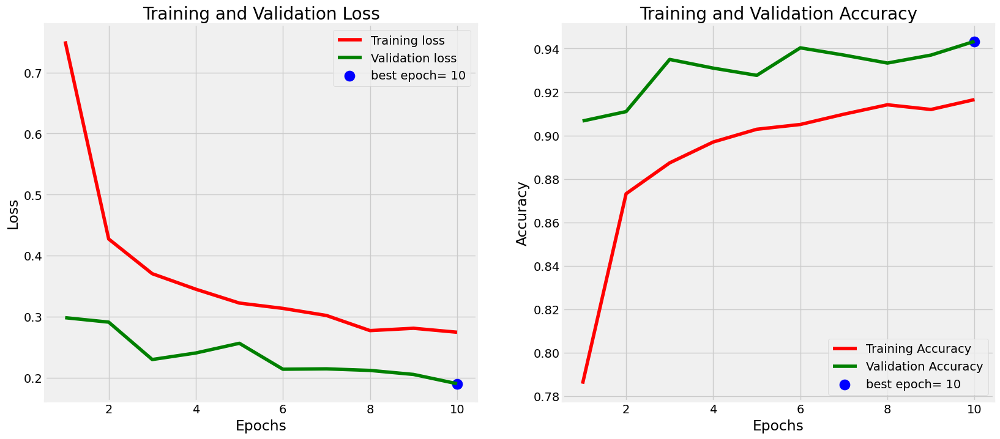

In [20]:

tr_acc = history.history['accuracy']
tr_loss = history.history['loss']
val_acc = history.history['val_accuracy']
val_loss = history.history['val_loss']
index_loss = np.argmin(val_loss)
val_lowest = val_loss[index_loss]
index_acc = np.argmax(val_acc)
acc_highest = val_acc[index_acc]
Epochs = [i+1 for i in range(len(tr_acc))]
loss_label = f'best epoch= {str(index_loss + 1)}'
acc_label = f'best epoch= {str(index_acc + 1)}'


plt.figure(figsize= (20, 8))
plt.style.use('fivethirtyeight')

plt.subplot(1, 2, 1)
plt.plot(Epochs, tr_loss, 'r', label= 'Training loss')
plt.plot(Epochs, val_loss, 'g', label= 'Validation loss')
plt.scatter(index_loss + 1, val_lowest, s= 150, c= 'blue', label= loss_label)
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(Epochs, tr_acc, 'r', label= 'Training Accuracy')
plt.plot(Epochs, val_acc, 'g', label= 'Validation Accuracy')
plt.scatter(index_acc + 1 , acc_highest, s= 150, c= 'blue', label= acc_label)
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout
plt.show()

# 8. Model Performance Analysis
## 8.1 Classification Report & F1 Score

In [21]:
y_true = test_images.classes
y_pred = np.argmax(model.predict(test_images), axis = 1)
f1 = f1_score(y_true, y_pred, average='macro')
print("F1 Score:", f1)
print(classification_report(y_true, y_pred, target_names=test_images.class_indices.keys()))

90/90 ━━━━━━━━━━━━━━━━━━━━ 35s 323ms/step
F1 Score: 0.9347380933762313
                           precision    recall  f1-score   support

    Asian-Green-Bee-Eater       0.94      0.95      0.94       172
      Brown-Headed-Barbet       0.97      0.88      0.92       178
             Cattle-Egret       0.94      0.98      0.96       157
        Common-Kingfisher       0.97      0.91      0.94       173
              Common-Myna       0.99      0.91      0.95       172
         Common-Rosefinch       0.87      0.91      0.89       200
        Common-Tailorbird       0.84      0.92      0.88       177
       Coppersmith-Barbet       0.97      0.91      0.94       189
           Forest-Wagtail       0.93      0.91      0.92       209
             Gray-Wagtail       0.97      0.92      0.95       163
                   Hoopoe       0.98      0.98      0.98       183
               House-Crow       0.87      0.93      0.90       180
     Indian-Grey-Hornbill       0.88      0.87      0.88 

##  8.2 Prediction Results Compilation

In [22]:
classes = dict(zip(test_images.class_indices.values(), test_images.class_indices.keys()))
Predictions = pd.DataFrame({"Image Index" : list(range(len(test_images.labels))), 
                            "Test Labels" : test_images.labels, 
                            "Test Classes" : [classes[i] for i in test_images.labels],
                            "Prediction Labels" : y_pred,
                            "Prediction Classes" : [classes[i] for i in y_pred],
                            "Path": test_images.filenames,
                            "Prediction Probability" : [x for x in np.asarray(tf.reduce_max(model.predict(test_images), axis = 1))]
                           })
Predictions.head(8)

90/90 ━━━━━━━━━━━━━━━━━━━━ 29s 316ms/step


,Image Index,Test Labels,Test Classes,Prediction Labels,Prediction Classes,Path,Prediction Probability
0,0,6,Common-Tailorbird,6,Common-Tailorbird,/kaggle/input/indian-birds/Birds_25/train/Comm...,0.999897
1,1,13,Indian-Peacock,13,Indian-Peacock,/kaggle/input/indian-birds/Birds_25/valid/Indi...,0.951685
2,2,10,Hoopoe,10,Hoopoe,/kaggle/input/indian-birds/Birds_25/train/Hoop...,0.999999
3,3,14,Indian-Pitta,14,Indian-Pitta,/kaggle/input/indian-birds/Birds_25/train/Indi...,0.999995
4,4,7,Coppersmith-Barbet,7,Coppersmith-Barbet,/kaggle/input/indian-birds/Birds_25/train/Copp...,0.999478
5,5,15,Indian-Roller,15,Indian-Roller,/kaggle/input/indian-birds/Birds_25/train/Indi...,0.999900
6,6,22,White-Breasted-Kingfisher,22,White-Breasted-Kingfisher,/kaggle/input/indian-birds/Birds_25/train/Whit...,0.996768
7,7,16,Jungle-Babbler,16,Jungle-Babbler,/kaggle/input/indian-birds/Birds_25/train/Jung...,0.828815


##  8.3 Visualization of Misclassified Images

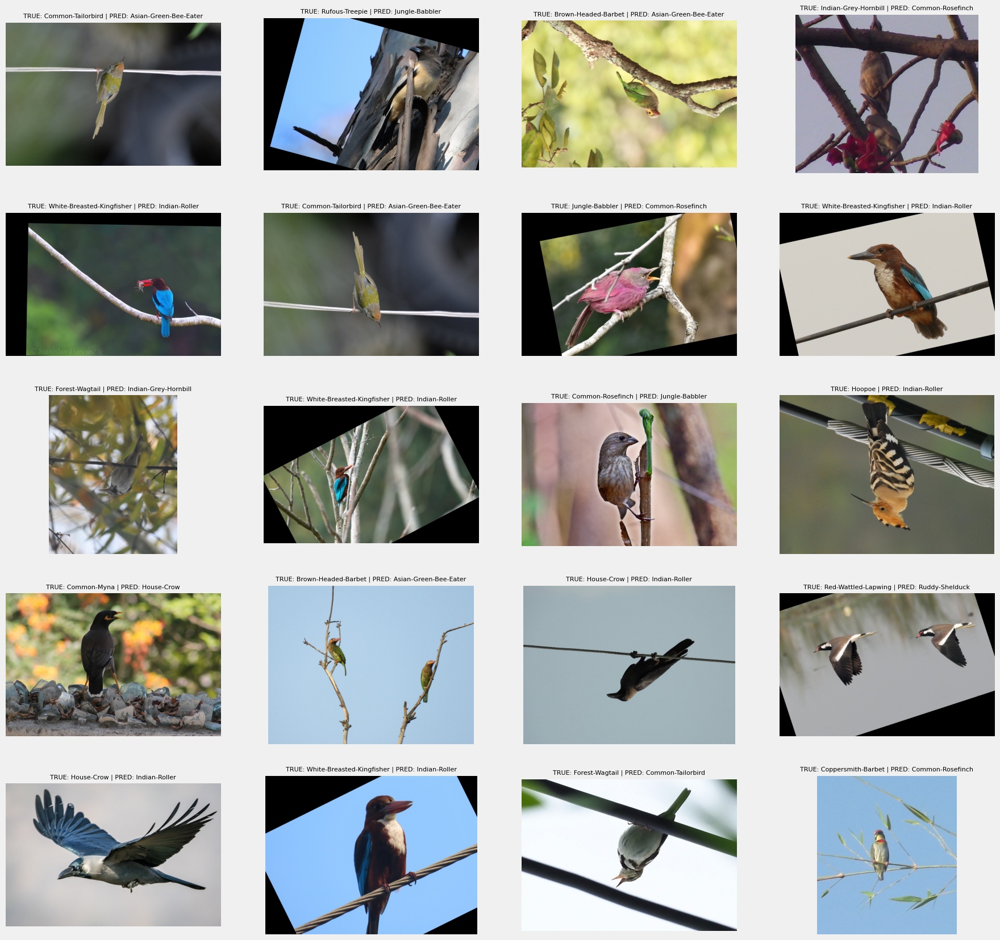

In [23]:
plt.figure(figsize=(20,20))
for i, row in Predictions[Predictions["Test Labels"] != Predictions["Prediction Labels"]].sort_values("Prediction Probability").tail(20).reset_index().iterrows():
    plt.subplot(5,4,i+1)
    image_path = row['Path']
    image = Image.open(image_path)
    plt.imshow(image)
    plt.title(f'TRUE: {row["Test Classes"]} | PRED: {row["Prediction Classes"]}', fontsize=8)
    plt.axis('off')
    
plt.show()

##  8.4 Confusion Matrix Visualization

90/90 ━━━━━━━━━━━━━━━━━━━━ 29s 327ms/step


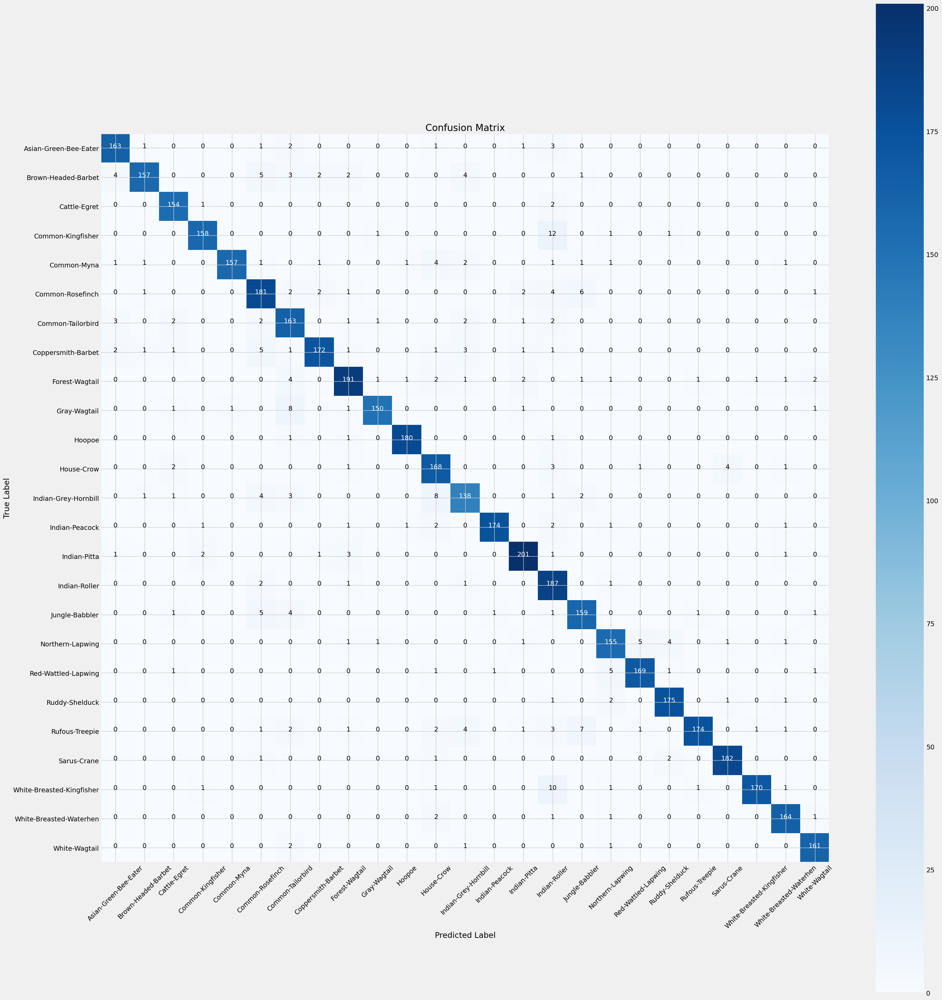

In [24]:
import numpy as np
import matplotlib.pyplot as plt
import itertools
from sklearn.metrics import confusion_matrix


preds = model.predict(test_images)  
y_pred = np.argmax(preds, axis=1)


g_dict = test_images.class_indices
classes = list(g_dict.keys())


cm = confusion_matrix(test_images.classes, y_pred)

plt.figure(figsize=(30, 30))
plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.colorbar()

tick_marks = np.arange(len(classes))
plt.xticks(tick_marks, classes, rotation=45)
plt.yticks(tick_marks, classes)

thresh = cm.max() / 2.
for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
    plt.text(j, i, cm[i, j],
             horizontalalignment='center',
             color='white' if cm[i, j] > thresh else 'black')

plt.tight_layout()
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.show()


# 9. Model Fine-tuning & Training
## 9.1 Fine-tuning Pretrained Model Layers then Re-compiling & Training with Lower Learning Rate

In [25]:
pretrained_model.trainable = True
for layer in pretrained_model.layers:
    if isinstance(layer, layers.BatchNormalization): 
        layer.trainable = False
        

for l in pretrained_model.layers[:10]:
    print(l.name, l.trainable)

model.compile(
    optimizer=Adam(0.00001), 
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

print(model.summary())
history = model.fit(
    train_images,
    validation_data=val_images,
    epochs=10,
    callbacks=[
        EarlyStopping(monitor="val_loss", patience=5, restore_best_weights=True),
        ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=2, mode='min')
    ]
)


#model.save_weights('./checkpoints/my_checkpoint')

input_layer False
rescaling False
normalization False
rescaling_1 False
stem_conv_pad False
stem_conv False
stem_bn False
stem_activation False
block1a_dwconv False
block1a_bn False


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ inputLayer (InputLayer)              │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ cast_1 (Cast)                        │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ AugmentationLayer (Sequential)       │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ efficientnetb3 (Functional)          │ (None, 1536)                │      10,783,535 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 256)                 │         393,472 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation (Activation)              │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 256)                 │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 25)                  │           6,425 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ cast_2 (Cast)                        │ (None, 25)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activationLayer (Activation)         │ (None, 25)                  │               0 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,184,456 (42.67 MB)

 Trainable params: 400,409 (1.53 MB)

 Non-trainable params: 10,784,047 (41.14 MB)

None
Epoch 1/10
600/600 ━━━━━━━━━━━━━━━━━━━━ 268s 395ms/step - accuracy: 0.9184 - loss: 0.2645 - val_accuracy: 0.9503 - val_loss: 0.1689 - learning_rate: 1.0000e-05
Epoch 2/10
600/600 ━━━━━━━━━━━━━━━━━━━━ 227s 375ms/step - accuracy: 0.9240 - loss: 0.2487 - val_accuracy: 0.9517 - val_loss: 0.1662 - learning_rate: 1.0000e-05
Epoch 3/10
600/600 ━━━━━━━━━━━━━━━━━━━━ 237s 391ms/step - accuracy: 0.9239 - loss: 0.2460 - val_accuracy: 0.9503 - val_loss: 0.1637 - learning_rate: 1.0000e-05
Epoch 4/10
600/600 ━━━━━━━━━━━━━━━━━━━━ 236s 388ms/step - accuracy: 0.9247 - loss: 0.2375 - val_accuracy: 0.9487 - val_loss: 0.1624 - learning_rate: 1.0000e-05
Epoch 5/10
600/600 ━━━━━━━━━━━━━━━━━━━━ 230s 380ms/step - accuracy: 0.9279 - loss: 0.2386 - val_accuracy: 0.9497 - val_loss: 0.1607 - learning_rate: 1.0000e-05
Epoch 6/10
600/600 ━━━━━━━━━━━━━━━━━━━━ 233s 384ms/step - accuracy: 0.9259 - loss: 0.2303 - val_accuracy: 0.9483 - val_loss: 0.1608 - learning_rate: 1.0000e-05
Epoch 7/10
600/600 ━━━━━━━━━━━━━━━━

## 9.2 Save Model Weights to Checkpoint

In [26]:
import os


checkpoint_dir = './checkpoints'
if not os.path.exists(checkpoint_dir):
    os.makedirs(checkpoint_dir)


model.save_weights(os.path.join(checkpoint_dir, 'my_checkpoint.weights.h5'))


## 9.3 Evaluate on Test Dataset

In [27]:
results = model.evaluate(test_images, verbose=0)

print("    Test Loss: {:.5f}".format(results[0]))
print("Test Accuracy: {:.2f}%".format(results[1] * 100))

    Test Loss: 0.16629
Test Accuracy: 94.62%


## 9.4 Training History Visualization

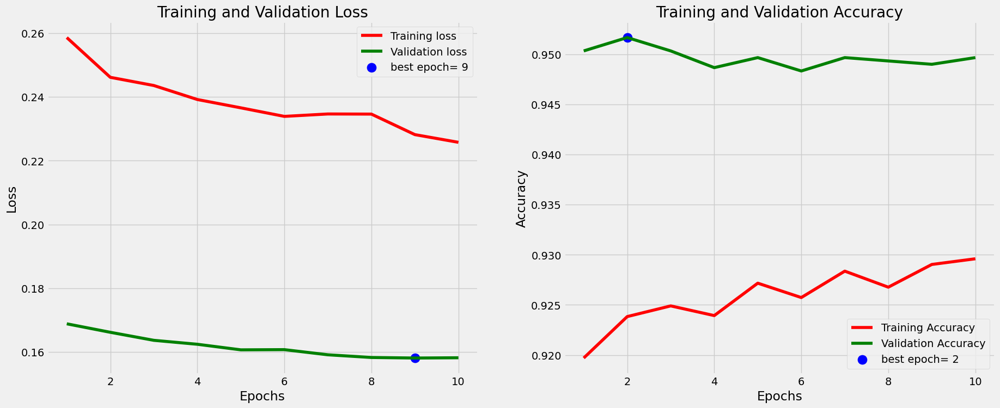

In [28]:

tr_acc = history.history['accuracy']
tr_loss = history.history['loss']
val_acc = history.history['val_accuracy']
val_loss = history.history['val_loss']
index_loss = np.argmin(val_loss)
val_lowest = val_loss[index_loss]
index_acc = np.argmax(val_acc)
acc_highest = val_acc[index_acc]
Epochs = [i+1 for i in range(len(tr_acc))]
loss_label = f'best epoch= {str(index_loss + 1)}'
acc_label = f'best epoch= {str(index_acc + 1)}'


plt.figure(figsize= (20, 8))
plt.style.use('fivethirtyeight')

plt.subplot(1, 2, 1)
plt.plot(Epochs, tr_loss, 'r', label= 'Training loss')
plt.plot(Epochs, val_loss, 'g', label= 'Validation loss')
plt.scatter(index_loss + 1, val_lowest, s= 150, c= 'blue', label= loss_label)
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(Epochs, tr_acc, 'r', label= 'Training Accuracy')
plt.plot(Epochs, val_acc, 'g', label= 'Validation Accuracy')
plt.scatter(index_acc + 1 , acc_highest, s= 150, c= 'blue', label= acc_label)
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout
plt.show()

# 10. Model Performance Analysis
## 10.1 Classification Report & F1 Score

In [29]:
y_true = test_images.classes
y_pred = np.argmax(model.predict(test_images), axis = 1)
f1 = f1_score(y_true, y_pred, average='macro')
print("F1 Score:", f1)
print(classification_report(y_true, y_pred, target_names=test_images.class_indices.keys()))

90/90 ━━━━━━━━━━━━━━━━━━━━ 35s 320ms/step
F1 Score: 0.9461014411657367
                           precision    recall  f1-score   support

    Asian-Green-Bee-Eater       0.92      0.96      0.94       172
      Brown-Headed-Barbet       0.90      0.93      0.91       178
             Cattle-Egret       0.99      0.94      0.97       157
        Common-Kingfisher       0.97      0.97      0.97       173
              Common-Myna       0.96      0.95      0.96       172
         Common-Rosefinch       0.91      0.93      0.92       200
        Common-Tailorbird       0.88      0.92      0.90       177
       Coppersmith-Barbet       0.97      0.93      0.95       189
           Forest-Wagtail       0.94      0.91      0.93       209
             Gray-Wagtail       0.95      0.94      0.95       163
                   Hoopoe       0.99      0.98      0.99       183
               House-Crow       0.88      0.93      0.91       180
     Indian-Grey-Hornbill       0.87      0.92      0.89 

## 10.2 Prediction Results Compilation

In [30]:
classes = dict(zip(test_images.class_indices.values(), test_images.class_indices.keys()))
Predictions = pd.DataFrame({"Image Index" : list(range(len(test_images.labels))), 
                            "Test Labels" : test_images.labels, 
                            "Test Classes" : [classes[i] for i in test_images.labels],
                            "Prediction Labels" : y_pred,
                            "Prediction Classes" : [classes[i] for i in y_pred],
                            "Path": test_images.filenames,
                            "Prediction Probability" : [x for x in np.asarray(tf.reduce_max(model.predict(test_images), axis = 1))]
                           })
Predictions.head(8)

90/90 ━━━━━━━━━━━━━━━━━━━━ 30s 332ms/step


,Image Index,Test Labels,Test Classes,Prediction Labels,Prediction Classes,Path,Prediction Probability
0,0,6,Common-Tailorbird,6,Common-Tailorbird,/kaggle/input/indian-birds/Birds_25/train/Comm...,0.999821
1,1,13,Indian-Peacock,13,Indian-Peacock,/kaggle/input/indian-birds/Birds_25/valid/Indi...,0.981975
2,2,10,Hoopoe,10,Hoopoe,/kaggle/input/indian-birds/Birds_25/train/Hoop...,0.999999
3,3,14,Indian-Pitta,14,Indian-Pitta,/kaggle/input/indian-birds/Birds_25/train/Indi...,0.999995
4,4,7,Coppersmith-Barbet,7,Coppersmith-Barbet,/kaggle/input/indian-birds/Birds_25/train/Copp...,0.999724
5,5,15,Indian-Roller,15,Indian-Roller,/kaggle/input/indian-birds/Birds_25/train/Indi...,0.999531
6,6,22,White-Breasted-Kingfisher,22,White-Breasted-Kingfisher,/kaggle/input/indian-birds/Birds_25/train/Whit...,0.998121
7,7,16,Jungle-Babbler,16,Jungle-Babbler,/kaggle/input/indian-birds/Birds_25/train/Jung...,0.795897


## 10.3 Visualization of Misclassified Images

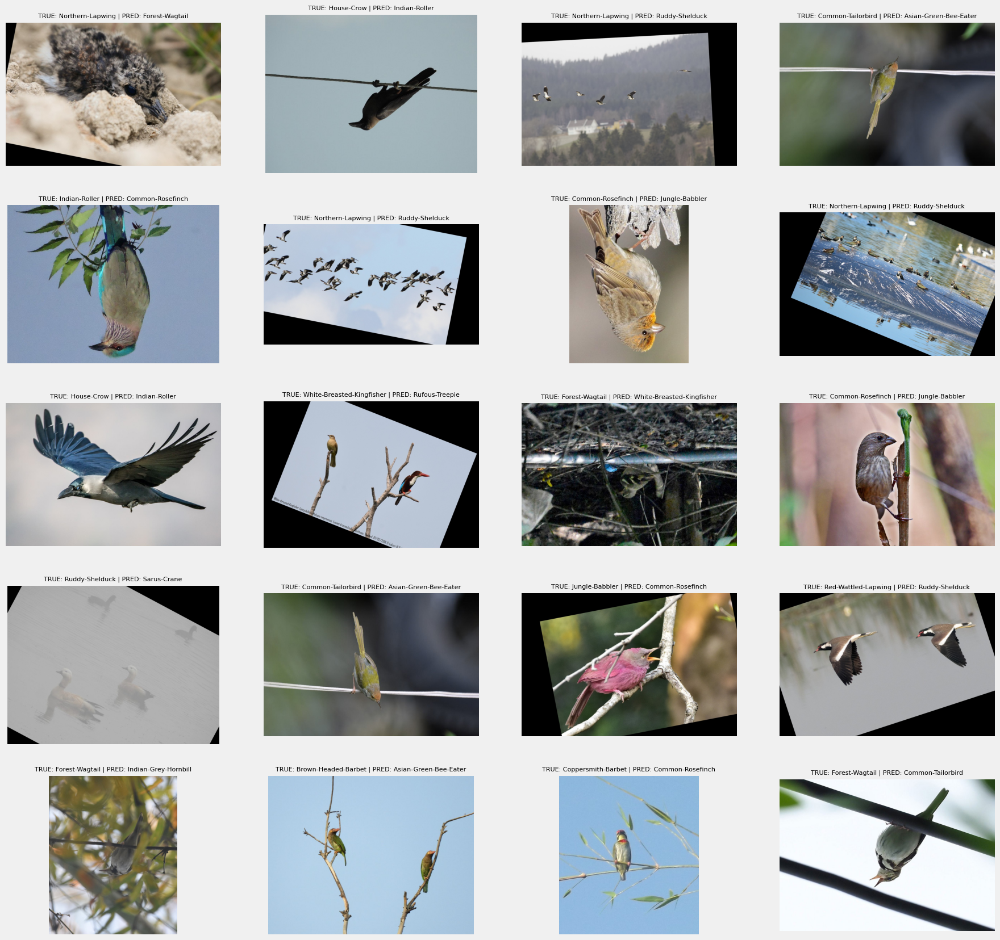

In [31]:
plt.figure(figsize=(20,20))
for i, row in Predictions[Predictions["Test Labels"] != Predictions["Prediction Labels"]].sort_values("Prediction Probability").tail(20).reset_index().iterrows():
    plt.subplot(5,4,i+1)
    image_path = row['Path']
    image = Image.open(image_path)
    plt.imshow(image)
    plt.title(f'TRUE: {row["Test Classes"]} | PRED: {row["Prediction Classes"]}', fontsize=8)
    plt.axis('off')
    
plt.show()

##  10.4 Confusion Matrix Visualization 

90/90 ━━━━━━━━━━━━━━━━━━━━ 29s 320ms/step


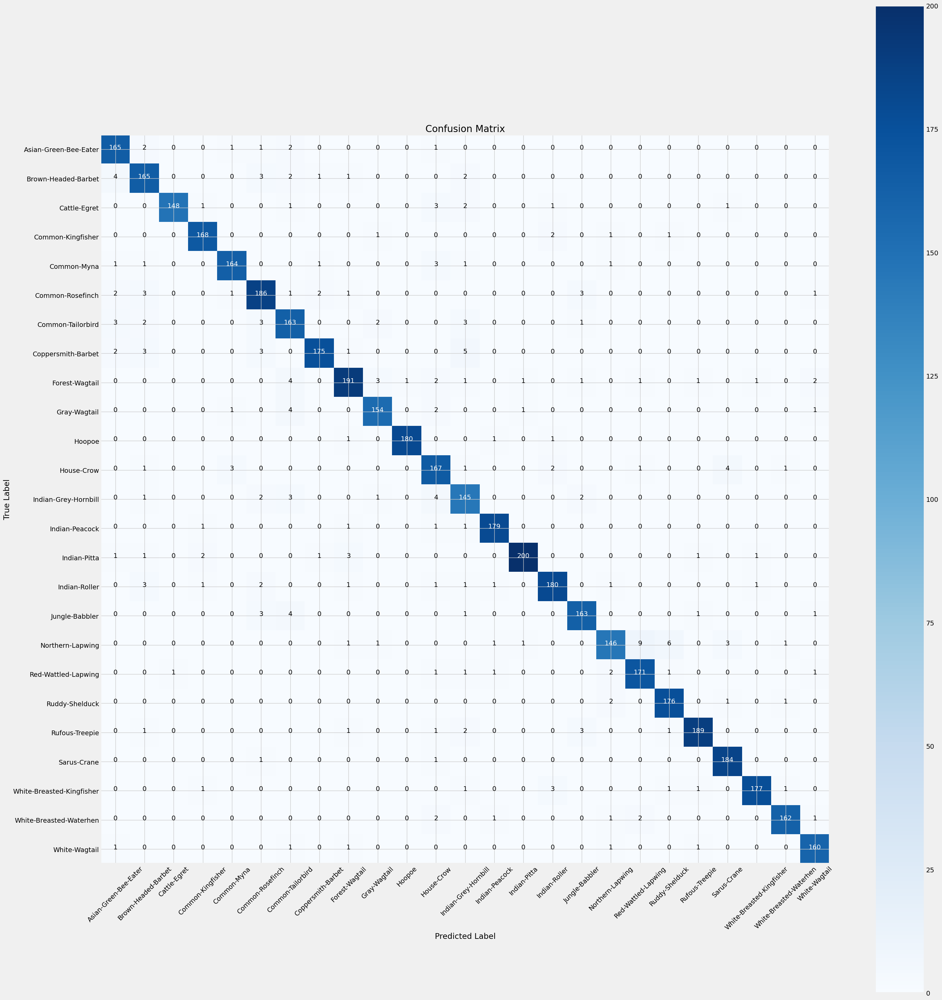

In [32]:
import numpy as np
import matplotlib.pyplot as plt
import itertools
from sklearn.metrics import confusion_matrix


preds = model.predict(test_images)  
y_pred = np.argmax(preds, axis=1)


g_dict = test_images.class_indices
classes = list(g_dict.keys())


cm = confusion_matrix(test_images.classes, y_pred)

plt.figure(figsize=(30, 30))
plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.colorbar()

tick_marks = np.arange(len(classes))
plt.xticks(tick_marks, classes, rotation=45)
plt.yticks(tick_marks, classes)

thresh = cm.max() / 2.
for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
    plt.text(j, i, cm[i, j],
             horizontalalignment='center',
             color='white' if cm[i, j] > thresh else 'black')

plt.tight_layout()
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.show()


# 11.Custom Model Building with EfficientNetB3
## 11.1 Advanced Data Augmentation Layer with Model Architecture and Initial Training (Frozen Base)

In [33]:
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras import layers
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers import BatchNormalization, Dropout
from tensorflow.keras.applications import EfficientNetB3
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau


pretrained_model = EfficientNetB3(include_top=False, input_shape=(224, 224, 3), pooling='avg')


num_classes = len(set(train_images.classes))


augment = tf.keras.Sequential([
    layers.RandomFlip("horizontal"),
    layers.RandomRotation(0.15),
    layers.RandomZoom(0.2),
    layers.RandomContrast(0.2),
], name='AugmentationLayer')


inputs = layers.Input(shape=(224, 224, 3), name='inputLayer')


x = augment(inputs)


x = layers.Rescaling(1./255)(x)


x = pretrained_model(x, training=False)


x = layers.Dense(512)(x)
x = layers.LeakyReLU()(x)
x = Dropout(0.4)(x)
x = BatchNormalization()(x)

x = layers.Dense(256, activation='relu')(x)
x = Dropout(0.3)(x)

x = layers.Dense(128, activation='relu')(x)


x = layers.Dense(num_classes)(x)
outputs = layers.Activation("softmax", dtype=tf.float32, name='activationLayer')(x)


model = Model(inputs=inputs, outputs=outputs)


model.compile(
    optimizer=Adam(learning_rate=0.0005),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)


model.summary()


history = model.fit(
    train_images,
    validation_data=val_images,
    epochs=10,
    callbacks=[
        EarlyStopping(monitor="val_loss", patience=3, restore_best_weights=True),
        ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=2, mode='min')
    ]
)


# model.save_weights('./checkpoints/efficientnetb3_custom_checkpoint.h5')


Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ inputLayer (InputLayer)              │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ cast_4 (Cast)                        │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ AugmentationLayer (Sequential)       │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ rescaling_4 (Rescaling)              │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ efficientnetb3 (Functional)          │ (None, 1536)                │      10,783,535 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 512)                 │         786,944 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu (LeakyReLU)              │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 512)                 │           2,048 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 256)                 │         131,328 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (Dropout)                  │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4 (Dense)                      │ (None, 128)                 │          32,896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5 (Dense)                      │ (None, 25)                  │           3,225 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ cast_5 (Cast)                        │ (None, 25)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activationLayer (Activation)         │ (None, 25)                  │               0 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,739,976 (44.78 MB)

 Trainable params: 11,651,649 (44.45 MB)

 Non-trainable params: 88,327 (345.03 KB)

Epoch 1/10
600/600 ━━━━━━━━━━━━━━━━━━━━ 622s 864ms/step - accuracy: 0.6502 - loss: 1.2617 - val_accuracy: 0.6477 - val_loss: 1.3276 - learning_rate: 5.0000e-04
Epoch 2/10
600/600 ━━━━━━━━━━━━━━━━━━━━ 520s 861ms/step - accuracy: 0.9365 - loss: 0.2185 - val_accuracy: 0.9503 - val_loss: 0.1619 - learning_rate: 5.0000e-04
Epoch 3/10
600/600 ━━━━━━━━━━━━━━━━━━━━ 523s 866ms/step - accuracy: 0.9552 - loss: 0.1572 - val_accuracy: 0.9600 - val_loss: 0.1331 - learning_rate: 5.0000e-04
Epoch 4/10
600/600 ━━━━━━━━━━━━━━━━━━━━ 511s 846ms/step - accuracy: 0.9596 - loss: 0.1407 - val_accuracy: 0.9427 - val_loss: 0.2128 - learning_rate: 5.0000e-04
Epoch 5/10
600/600 ━━━━━━━━━━━━━━━━━━━━ 510s 844ms/step - accuracy: 0.9666 - loss: 0.1190 - val_accuracy: 0.9650 - val_loss: 0.1144 - learning_rate: 5.0000e-04
Epoch 6/10
600/600 ━━━━━━━━━━━━━━━━━━━━ 507s 840ms/step - accuracy: 0.9683 - loss: 0.1076 - val_accuracy: 0.9567 - val_loss: 0.1374 - learning_rate: 5.0000e-04
Epoch 7/10
600/600 ━━━━━━━━━━━━━━━━━━━━ 

## 11.2 Evaluate on Test Dataset

In [34]:
results = model.evaluate(test_images, verbose=0)

print("    Test Loss: {:.5f}".format(results[0]))
print("Test Accuracy: {:.2f}%".format(results[1] * 100))

    Test Loss: 0.05715
Test Accuracy: 98.47%


## 11.3 Training History Visualization

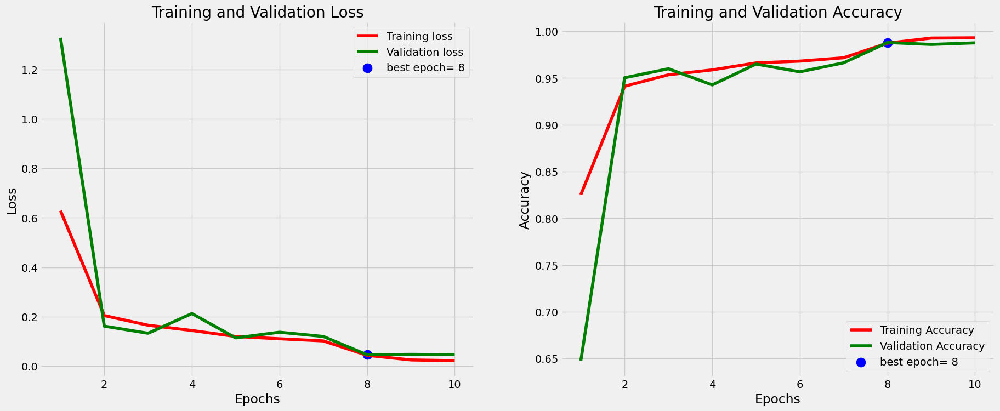

In [35]:

tr_acc = history.history['accuracy']
tr_loss = history.history['loss']
val_acc = history.history['val_accuracy']
val_loss = history.history['val_loss']
index_loss = np.argmin(val_loss)
val_lowest = val_loss[index_loss]
index_acc = np.argmax(val_acc)
acc_highest = val_acc[index_acc]
Epochs = [i+1 for i in range(len(tr_acc))]
loss_label = f'best epoch= {str(index_loss + 1)}'
acc_label = f'best epoch= {str(index_acc + 1)}'


plt.figure(figsize= (20, 8))
plt.style.use('fivethirtyeight')

plt.subplot(1, 2, 1)
plt.plot(Epochs, tr_loss, 'r', label= 'Training loss')
plt.plot(Epochs, val_loss, 'g', label= 'Validation loss')
plt.scatter(index_loss + 1, val_lowest, s= 150, c= 'blue', label= loss_label)
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(Epochs, tr_acc, 'r', label= 'Training Accuracy')
plt.plot(Epochs, val_acc, 'g', label= 'Validation Accuracy')
plt.scatter(index_acc + 1 , acc_highest, s= 150, c= 'blue', label= acc_label)
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout
plt.show()

## 11.3 Classification Report & F1 Score

In [36]:
y_true = test_images.classes
y_pred = np.argmax(model.predict(test_images), axis = 1)
f1 = f1_score(y_true, y_pred, average='macro')
print("F1 Score:", f1)
print(classification_report(y_true, y_pred, target_names=test_images.class_indices.keys()))

90/90 ━━━━━━━━━━━━━━━━━━━━ 37s 324ms/step
F1 Score: 0.9847502327236128
                           precision    recall  f1-score   support

    Asian-Green-Bee-Eater       0.98      0.98      0.98       172
      Brown-Headed-Barbet       0.98      0.98      0.98       178
             Cattle-Egret       0.99      1.00      1.00       157
        Common-Kingfisher       0.98      1.00      0.99       173
              Common-Myna       0.98      1.00      0.99       172
         Common-Rosefinch       0.98      0.98      0.98       200
        Common-Tailorbird       0.99      0.97      0.98       177
       Coppersmith-Barbet       0.98      0.98      0.98       189
           Forest-Wagtail       0.97      0.98      0.97       209
             Gray-Wagtail       1.00      1.00      1.00       163
                   Hoopoe       0.99      0.99      0.99       183
               House-Crow       0.98      0.99      0.98       180
     Indian-Grey-Hornbill       0.96      0.96      0.96 

## 11.4 Training and Validation Curve Visualization for Custom CNN EfficientNetB3 Model

In [37]:
import matplotlib.pyplot as plt
import numpy as np

def plot_training_curves(history, model_name):
    loss = np.array(history.history['loss'])
    val_loss = np.array(history.history['val_loss'])
    accuracy = np.array(history.history['accuracy'])
    val_accuracy = np.array(history.history['val_accuracy'])
    epochs = range(len(loss))

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
    fig.suptitle(f'Training Curves for {model_name}', fontsize=16)

 
    ax1.plot(epochs, loss, label='Training Loss', marker='o')
    ax1.plot(epochs, val_loss, label='Validation Loss', marker='o')
    ax1.fill_between(epochs, loss, val_loss, where=(loss > val_loss), color='C0', alpha=0.3, interpolate=True)
    ax1.fill_between(epochs, loss, val_loss, where=(loss < val_loss), color='C1', alpha=0.3, interpolate=True)
    ax1.set_title('Loss (Lower is Better)', fontsize=14)
    ax1.set_xlabel('Epochs', fontsize=12)
    ax1.set_ylabel('Loss', fontsize=12)
    ax1.legend()


    ax2.plot(epochs, accuracy, label='Training Accuracy', marker='o')
    ax2.plot(epochs, val_accuracy, label='Validation Accuracy', marker='o')
    ax2.fill_between(epochs, accuracy, val_accuracy, where=(accuracy > val_accuracy), color='C0', alpha=0.3, interpolate=True)
    ax2.fill_between(epochs, accuracy, val_accuracy, where=(accuracy < val_accuracy), color='C1', alpha=0.3, interpolate=True)
    ax2.set_title('Accuracy (Higher is Better)', fontsize=14)
    ax2.set_xlabel('Epochs', fontsize=12)
    ax2.set_ylabel('Accuracy', fontsize=12)
    ax2.legend()

    plt.show()

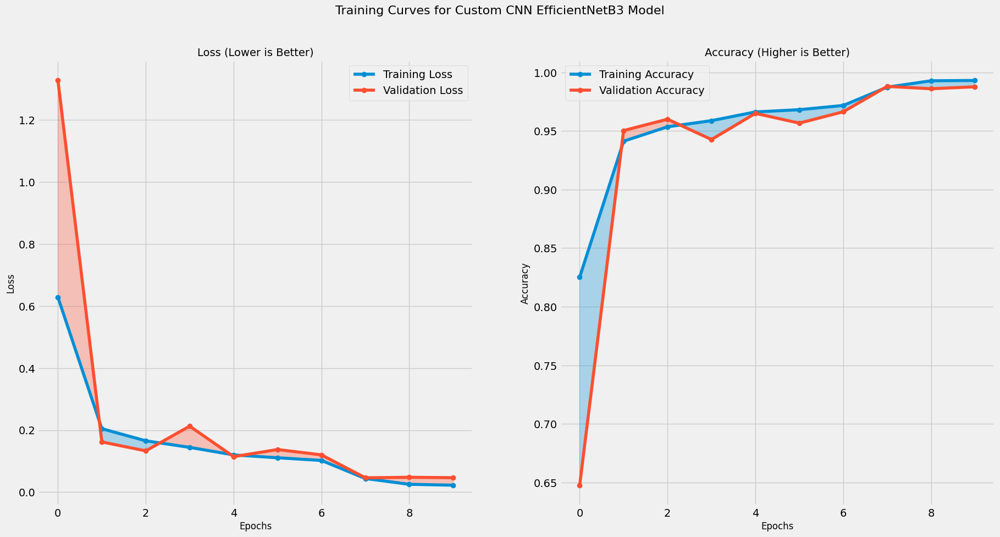

In [38]:
plot_training_curves(history, 'Custom CNN EfficientNetB3 Model')

## 11.5 Epoch-wise Gain vs. Loss Delta Plot

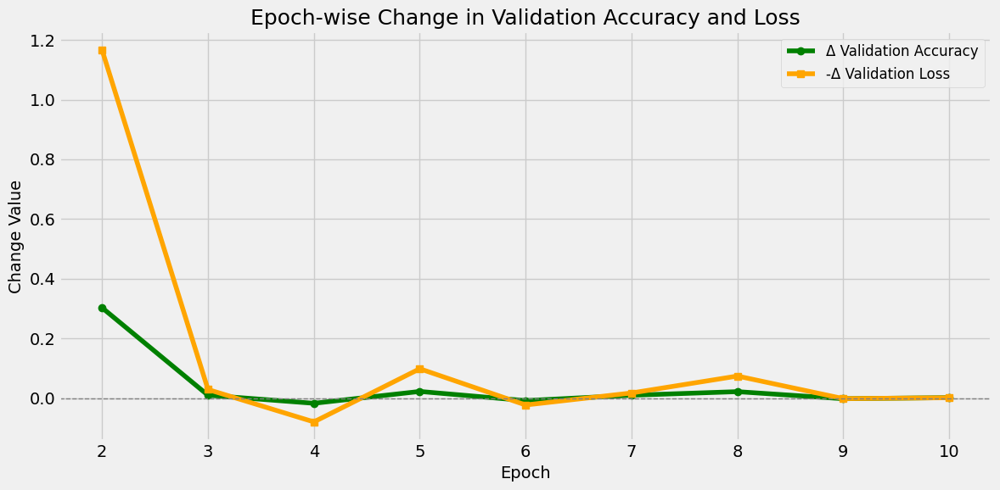

In [39]:
import numpy as np
import matplotlib.pyplot as plt


delta_val_acc = np.diff(val_acc)
delta_val_loss = -np.diff(val_loss)  
epochs = list(range(2, len(val_acc)+1)) 
plt.figure(figsize=(12, 6))
plt.plot(epochs, delta_val_acc, label='Δ Validation Accuracy', marker='o', color='green')
plt.plot(epochs, delta_val_loss, label='-Δ Validation Loss', marker='s', color='orange')

plt.axhline(0, color='gray', linestyle='--', linewidth=1)

plt.title('Epoch-wise Change in Validation Accuracy and Loss', fontsize=18)
plt.xlabel('Epoch', fontsize=14)
plt.ylabel('Change Value', fontsize=14)
plt.legend(fontsize=12)
plt.grid(True)
plt.tight_layout()
plt.show()


## 11.6 Model Confidence Histogram

90/90 ━━━━━━━━━━━━━━━━━━━━ 30s 331ms/step


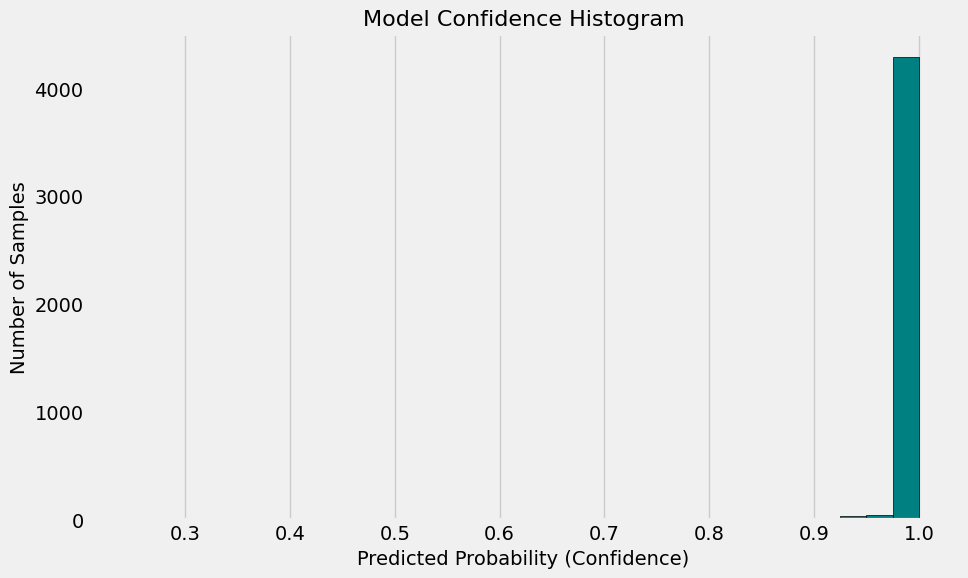

In [40]:
import numpy as np
import matplotlib.pyplot as plt


pred_probs = model.predict(test_images)
confidences = np.max(pred_probs, axis=1)

plt.figure(figsize=(10, 6))
plt.hist(confidences, bins=30, color='teal', edgecolor='black')
plt.title('Model Confidence Histogram', fontsize=16)
plt.xlabel('Predicted Probability (Confidence)', fontsize=14)
plt.ylabel('Number of Samples', fontsize=14)
plt.grid(axis='y')
plt.show()


## 11.7 Misclassification Heatmap

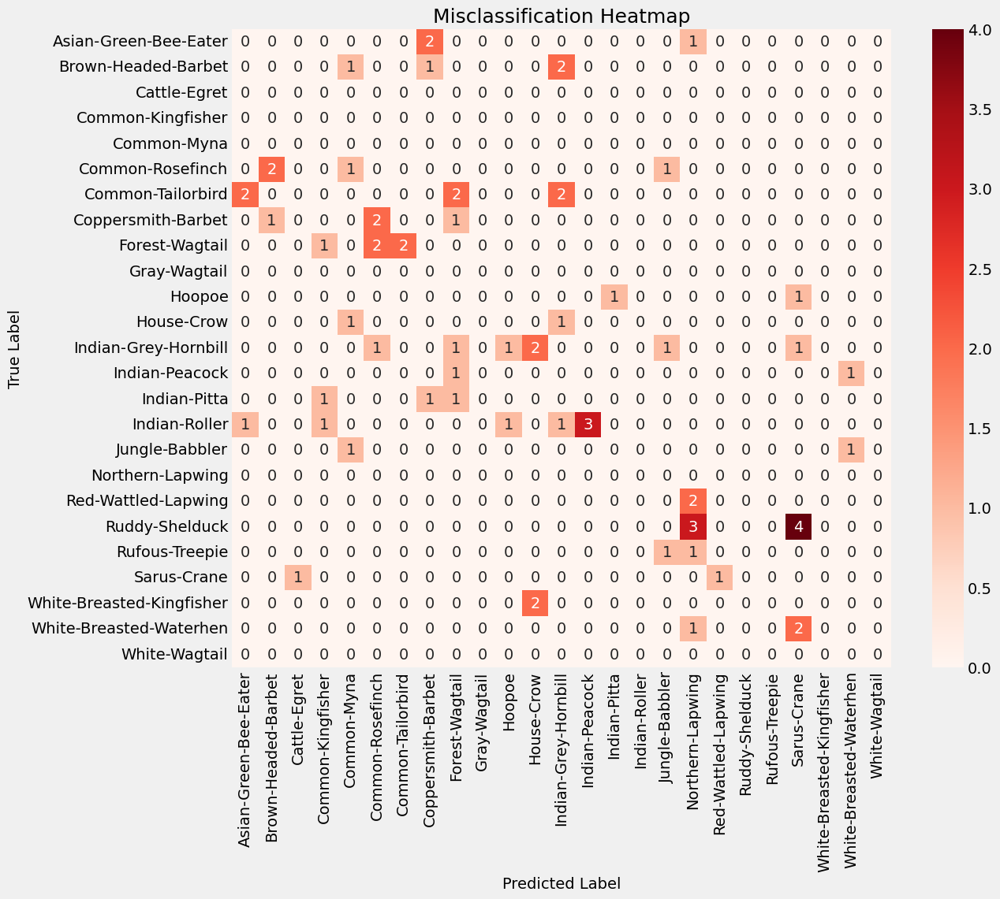

In [41]:
import seaborn as sns
from sklearn.metrics import confusion_matrix


true_labels = test_images.classes
pred_labels = np.argmax(pred_probs, axis=1)
class_names = list(test_images.class_indices.keys())


cm = confusion_matrix(true_labels, pred_labels)


cm_mis = cm.copy()
np.fill_diagonal(cm_mis, 0)

plt.figure(figsize=(12, 10))
sns.heatmap(cm_mis, annot=True, fmt='d', cmap='Reds', xticklabels=class_names, yticklabels=class_names)
plt.title('Misclassification Heatmap', fontsize=18)
plt.xlabel('Predicted Label', fontsize=14)
plt.ylabel('True Label', fontsize=14)
plt.show()


## 11.8 Prediction Results Compilation

In [42]:
classes = dict(zip(test_images.class_indices.values(), test_images.class_indices.keys()))
Predictions = pd.DataFrame({"Image Index" : list(range(len(test_images.labels))), 
                            "Test Labels" : test_images.labels, 
                            "Test Classes" : [classes[i] for i in test_images.labels],
                            "Prediction Labels" : y_pred,
                            "Prediction Classes" : [classes[i] for i in y_pred],
                            "Path": test_images.filenames,
                            "Prediction Probability" : [x for x in np.asarray(tf.reduce_max(model.predict(test_images), axis = 1))]
                           })
Predictions.head(8)

90/90 ━━━━━━━━━━━━━━━━━━━━ 30s 333ms/step


,Image Index,Test Labels,Test Classes,Prediction Labels,Prediction Classes,Path,Prediction Probability
0,0,6,Common-Tailorbird,6,Common-Tailorbird,/kaggle/input/indian-birds/Birds_25/train/Comm...,0.999941
1,1,13,Indian-Peacock,13,Indian-Peacock,/kaggle/input/indian-birds/Birds_25/valid/Indi...,0.999873
2,2,10,Hoopoe,10,Hoopoe,/kaggle/input/indian-birds/Birds_25/train/Hoop...,0.999998
3,3,14,Indian-Pitta,14,Indian-Pitta,/kaggle/input/indian-birds/Birds_25/train/Indi...,1.000000
4,4,7,Coppersmith-Barbet,7,Coppersmith-Barbet,/kaggle/input/indian-birds/Birds_25/train/Copp...,1.000000
5,5,15,Indian-Roller,15,Indian-Roller,/kaggle/input/indian-birds/Birds_25/train/Indi...,1.000000
6,6,22,White-Breasted-Kingfisher,22,White-Breasted-Kingfisher,/kaggle/input/indian-birds/Birds_25/train/Whit...,1.000000
7,7,16,Jungle-Babbler,16,Jungle-Babbler,/kaggle/input/indian-birds/Birds_25/train/Jung...,0.999795


## 11.9 Visualization of Misclassified Images

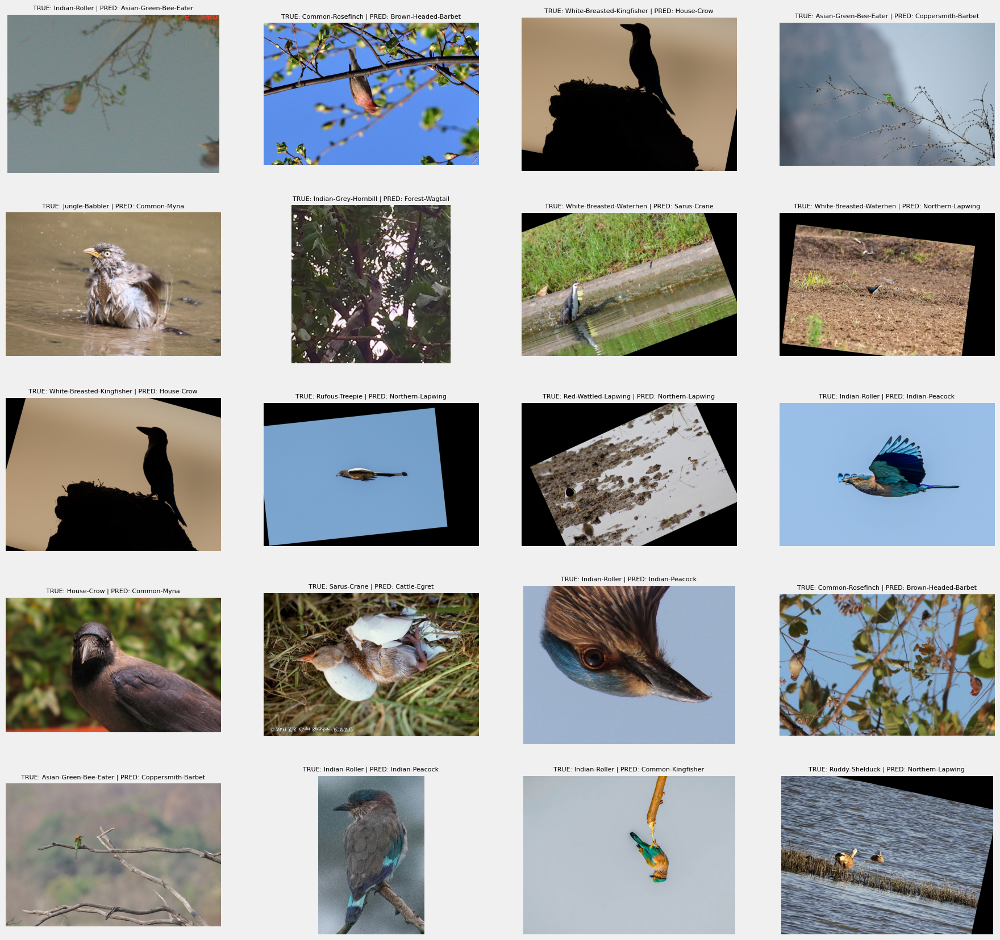

In [43]:
plt.figure(figsize=(20,20))
for i, row in Predictions[Predictions["Test Labels"] != Predictions["Prediction Labels"]].sort_values("Prediction Probability").tail(20).reset_index().iterrows():
    plt.subplot(5,4,i+1)
    image_path = row['Path']
    image = Image.open(image_path)
    plt.imshow(image)
    plt.title(f'TRUE: {row["Test Classes"]} | PRED: {row["Prediction Classes"]}', fontsize=8)
    plt.axis('off')
    
plt.show()

## 11.10 Confusion Matrix Visualization

90/90 ━━━━━━━━━━━━━━━━━━━━ 31s 338ms/step


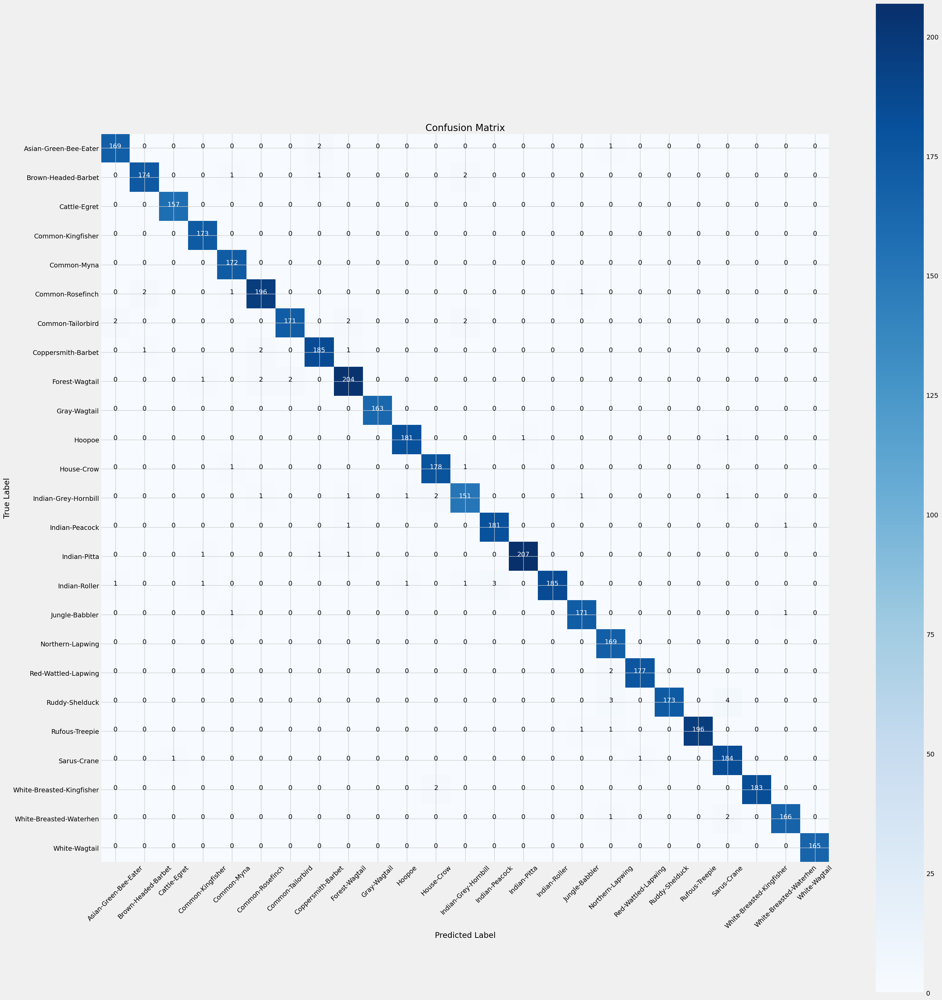

In [44]:
import numpy as np
import matplotlib.pyplot as plt
import itertools
from sklearn.metrics import confusion_matrix


preds = model.predict(test_images)  
y_pred = np.argmax(preds, axis=1)


g_dict = test_images.class_indices
classes = list(g_dict.keys())


cm = confusion_matrix(test_images.classes, y_pred)

plt.figure(figsize=(30, 30))
plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.colorbar()

tick_marks = np.arange(len(classes))
plt.xticks(tick_marks, classes, rotation=45)
plt.yticks(tick_marks, classes)

thresh = cm.max() / 2.
for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
    plt.text(j, i, cm[i, j],
             horizontalalignment='center',
             color='white' if cm[i, j] > thresh else 'black')

plt.tight_layout()
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.show()


# 12. Transfer Learning with ResNet152V2
## 12.1 Model Initialization (Pretrained + Frozen) with Custom Classification Head and Unfreezing Base Model & Recompilation and Fine-Tuning

In [45]:
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.applications import ResNet152V2
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau


base_model = ResNet152V2(include_top=False, weights='imagenet', input_shape=(224, 224, 3))
base_model.trainable = False  


data_augmentation = tf.keras.Sequential([
    layers.RandomFlip("horizontal"),
    layers.RandomZoom(0.1),
    layers.RandomTranslation(0.1, 0.1),
    layers.RandomContrast(0.2),
], name="data_augmentation")


inputs = layers.Input(shape=(224, 224, 3))
x = data_augmentation(inputs)
x = layers.Rescaling(1./255)(x)
x = base_model(x, training=False)
x = layers.GlobalAveragePooling2D()(x)


x = layers.Dense(1024, activation='relu')(x)
x = layers.Dropout(0.5)(x)
x = layers.Dense(512, activation='relu')(x)
x = layers.Dropout(0.3)(x)
x = layers.Dense(num_classes, activation='softmax')(x)

model = models.Model(inputs, x)


model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)


history = model.fit(
    train_images,
    validation_data=val_images,
    epochs=10,
    callbacks=[
        EarlyStopping(monitor="val_loss", patience=5, restore_best_weights=True),
        ReduceLROnPlateau(monitor="val_loss", factor=0.3, patience=2)
    ]
)


base_model.trainable = True
for layer in base_model.layers:
    if isinstance(layer, layers.BatchNormalization):
        layer.trainable = False

model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-5),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)


history_finetune = model.fit(
    train_images,
    validation_data=val_images,
    epochs=10,
    callbacks=[
        EarlyStopping(monitor="val_loss", patience=5, restore_best_weights=True),
        ReduceLROnPlateau(monitor="val_loss", factor=0.3, patience=2)
    ]
)


234545216/234545216 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step
Epoch 1/10
600/600 ━━━━━━━━━━━━━━━━━━━━ 281s 407ms/step - accuracy: 0.3909 - loss: 2.2186 - val_accuracy: 0.8283 - val_loss: 0.5433 - learning_rate: 1.0000e-04
Epoch 2/10
600/600 ━━━━━━━━━━━━━━━━━━━━ 237s 391ms/step - accuracy: 0.7454 - loss: 0.8405 - val_accuracy: 0.8617 - val_loss: 0.4347 - learning_rate: 1.0000e-04
Epoch 3/10
600/600 ━━━━━━━━━━━━━━━━━━━━ 264s 435ms/step - accuracy: 0.8001 - loss: 0.6539 - val_accuracy: 0.8750 - val_loss: 0.3891 - learning_rate: 1.0000e-04
Epoch 4/10
600/600 ━━━━━━━━━━━━━━━━━━━━ 244s 402ms/step - accuracy: 0.8229 - loss: 0.5639 - val_accuracy: 0.8797 - val_loss: 0.3714 - learning_rate: 1.0000e-04
Epoch 5/10
600/600 ━━━━━━━━━━━━━━━━━━━━ 243s 402ms/step - accuracy: 0.8407 - loss: 0.5107 - val_accuracy: 0.8910 - val_loss: 0.3388 - learning_rate: 1.0000e-04
Epoch 6/10
600/600 ━━━━━━━━━━━━━━━━━━━━ 241s 397ms/step - accuracy: 0.8593 - loss: 0.4460 - val_accuracy: 0.8937 - val_loss: 0.3279 - learning_rate

## 12.2 Evaluate on Test Dataset

In [46]:
results = model.evaluate(test_images, verbose=0)

print("    Test Loss: {:.5f}".format(results[0])) 
print("Test Accuracy: {:.2f}%".format(results[1] * 100))

    Test Loss: 0.11908
Test Accuracy: 97.11%


## 12.4 Classification Report & F1 Score

In [47]:
y_true = test_images.classes
y_pred = np.argmax(model.predict(test_images), axis = 1)
f1 = f1_score(y_true, y_pred, average='macro')
print("F1 Score:", f1)
print(classification_report(y_true, y_pred, target_names=test_images.class_indices.keys()))

90/90 ━━━━━━━━━━━━━━━━━━━━ 39s 334ms/step
F1 Score: 0.9712404032924816
                           precision    recall  f1-score   support

    Asian-Green-Bee-Eater       0.97      0.97      0.97       172
      Brown-Headed-Barbet       0.90      0.97      0.93       178
             Cattle-Egret       0.98      0.99      0.98       157
        Common-Kingfisher       0.98      0.99      0.98       173
              Common-Myna       0.98      0.98      0.98       172
         Common-Rosefinch       0.93      0.94      0.93       200
        Common-Tailorbird       0.97      0.91      0.94       177
       Coppersmith-Barbet       0.94      0.96      0.95       189
           Forest-Wagtail       0.99      0.96      0.98       209
             Gray-Wagtail       0.98      0.95      0.97       163
                   Hoopoe       0.99      0.99      0.99       183
               House-Crow       0.97      0.97      0.97       180
     Indian-Grey-Hornbill       0.94      0.96      0.95 

## 12.3 Training History Visualization

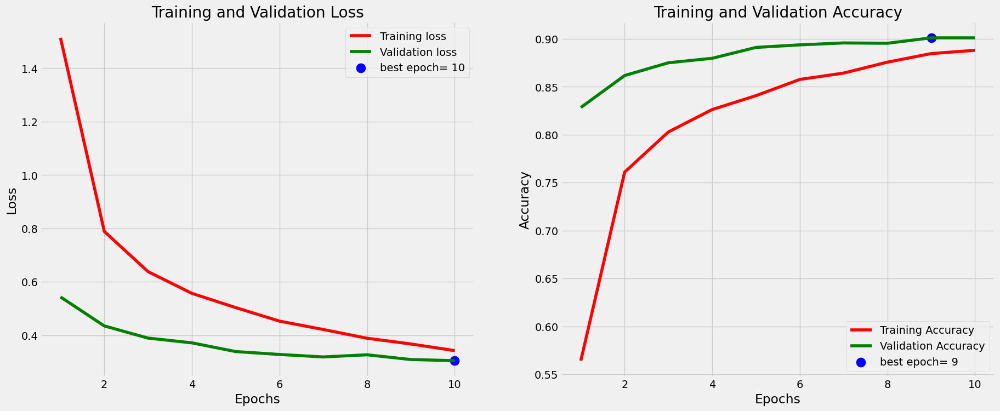

In [48]:

tr_acc = history.history['accuracy']
tr_loss = history.history['loss']
val_acc = history.history['val_accuracy']
val_loss = history.history['val_loss']
index_loss = np.argmin(val_loss)
val_lowest = val_loss[index_loss]
index_acc = np.argmax(val_acc)
acc_highest = val_acc[index_acc]
Epochs = [i+1 for i in range(len(tr_acc))]
loss_label = f'best epoch= {str(index_loss + 1)}'
acc_label = f'best epoch= {str(index_acc + 1)}'


plt.figure(figsize= (20, 8))
plt.style.use('fivethirtyeight')

plt.subplot(1, 2, 1)
plt.plot(Epochs, tr_loss, 'r', label= 'Training loss')
plt.plot(Epochs, val_loss, 'g', label= 'Validation loss')
plt.scatter(index_loss + 1, val_lowest, s= 150, c= 'blue', label= loss_label)
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(Epochs, tr_acc, 'r', label= 'Training Accuracy')
plt.plot(Epochs, val_acc, 'g', label= 'Validation Accuracy')
plt.scatter(index_acc + 1 , acc_highest, s= 150, c= 'blue', label= acc_label)
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout
plt.show()

## 12.5 Prediction Results Compilation

In [49]:
classes = dict(zip(test_images.class_indices.values(), test_images.class_indices.keys()))
Predictions = pd.DataFrame({"Image Index" : list(range(len(test_images.labels))), 
                            "Test Labels" : test_images.labels, 
                            "Test Classes" : [classes[i] for i in test_images.labels],
                            "Prediction Labels" : y_pred,
                            "Prediction Classes" : [classes[i] for i in y_pred],
                            "Path": test_images.filenames,
                            "Prediction Probability" : [x for x in np.asarray(tf.reduce_max(model.predict(test_images), axis = 1))]
                           })
Predictions.head(8)

90/90 ━━━━━━━━━━━━━━━━━━━━ 32s 354ms/step


,Image Index,Test Labels,Test Classes,Prediction Labels,Prediction Classes,Path,Prediction Probability
0,0,6,Common-Tailorbird,6,Common-Tailorbird,/kaggle/input/indian-birds/Birds_25/train/Comm...,1.000000
1,1,13,Indian-Peacock,13,Indian-Peacock,/kaggle/input/indian-birds/Birds_25/valid/Indi...,1.000000
2,2,10,Hoopoe,10,Hoopoe,/kaggle/input/indian-birds/Birds_25/train/Hoop...,1.000000
3,3,14,Indian-Pitta,14,Indian-Pitta,/kaggle/input/indian-birds/Birds_25/train/Indi...,1.000000
4,4,7,Coppersmith-Barbet,7,Coppersmith-Barbet,/kaggle/input/indian-birds/Birds_25/train/Copp...,1.000000
5,5,15,Indian-Roller,15,Indian-Roller,/kaggle/input/indian-birds/Birds_25/train/Indi...,1.000000
6,6,22,White-Breasted-Kingfisher,22,White-Breasted-Kingfisher,/kaggle/input/indian-birds/Birds_25/train/Whit...,0.999512
7,7,16,Jungle-Babbler,16,Jungle-Babbler,/kaggle/input/indian-birds/Birds_25/train/Jung...,0.999512


# 12.6 Visualization of Misclassified Images

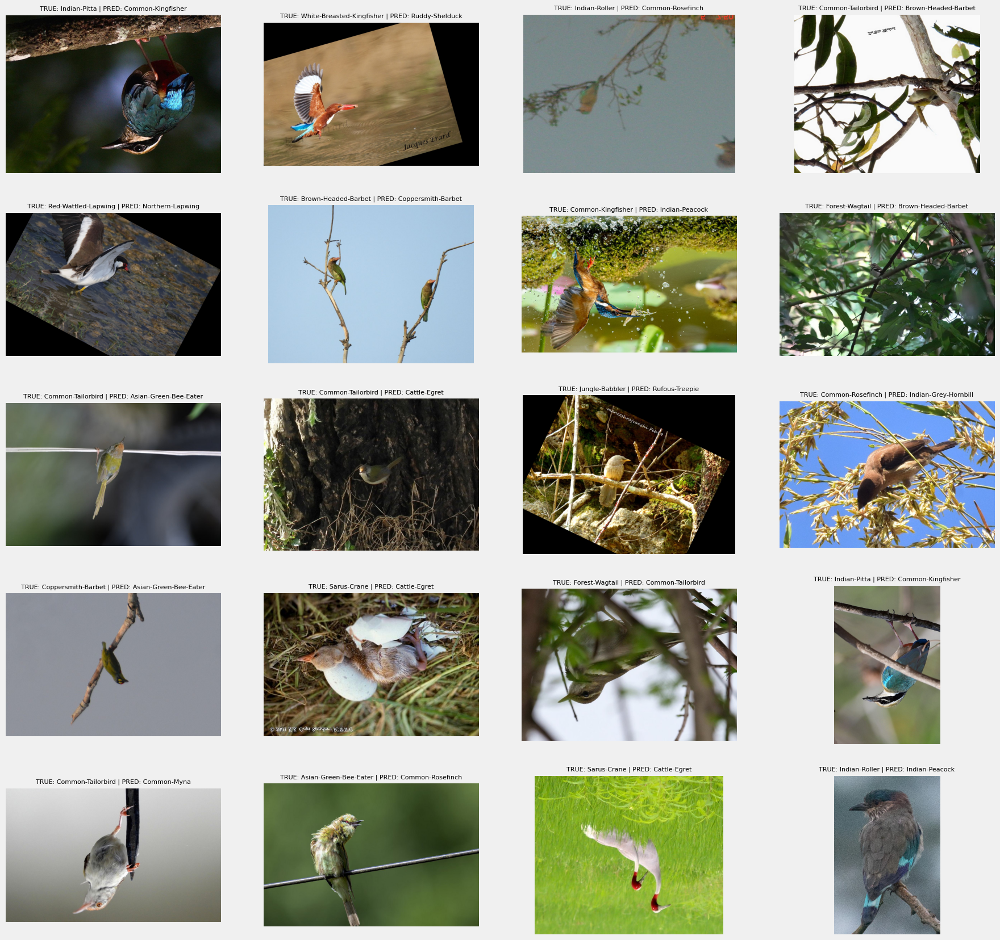

In [50]:
plt.figure(figsize=(20,20))
for i, row in Predictions[Predictions["Test Labels"] != Predictions["Prediction Labels"]].sort_values("Prediction Probability").tail(20).reset_index().iterrows():
    plt.subplot(5,4,i+1)
    image_path = row['Path']
    image = Image.open(image_path)
    plt.imshow(image)
    plt.title(f'TRUE: {row["Test Classes"]} | PRED: {row["Prediction Classes"]}', fontsize=8)
    plt.axis('off')
    
plt.show()

## 12.7 Confusion Matrix Visualization

90/90 ━━━━━━━━━━━━━━━━━━━━ 33s 362ms/step


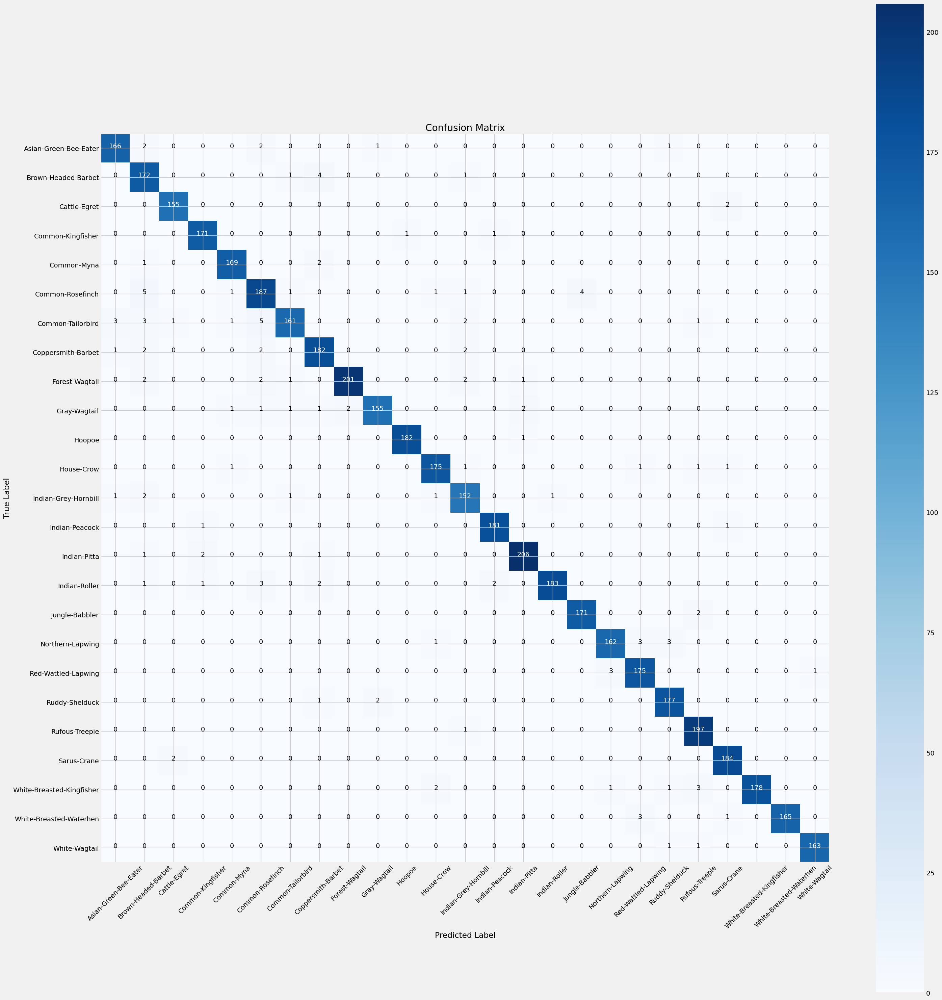

In [51]:
import numpy as np
import matplotlib.pyplot as plt
import itertools
from sklearn.metrics import confusion_matrix


preds = model.predict(test_images)  
y_pred = np.argmax(preds, axis=1)


g_dict = test_images.class_indices
classes = list(g_dict.keys())


cm = confusion_matrix(test_images.classes, y_pred)

plt.figure(figsize=(30, 30))
plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.colorbar()

tick_marks = np.arange(len(classes))
plt.xticks(tick_marks, classes, rotation=45)
plt.yticks(tick_marks, classes)

thresh = cm.max() / 2.
for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
    plt.text(j, i, cm[i, j],
             horizontalalignment='center',
             color='white' if cm[i, j] > thresh else 'black')

plt.tight_layout()
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.show()


# 13. Training and Validation Curve Visualization for ResNet152V2 Model

In [52]:
import matplotlib.pyplot as plt
import numpy as np

def plot_training_curves(history, model_name):
    loss = np.array(history.history['loss'])
    val_loss = np.array(history.history['val_loss'])
    accuracy = np.array(history.history['accuracy'])
    val_accuracy = np.array(history.history['val_accuracy'])
    epochs = range(len(loss))

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
    fig.suptitle(f'Training Curves for {model_name}', fontsize=16)

 
    ax1.plot(epochs, loss, label='Training Loss', marker='o')
    ax1.plot(epochs, val_loss, label='Validation Loss', marker='o')
    ax1.fill_between(epochs, loss, val_loss, where=(loss > val_loss), color='C0', alpha=0.3, interpolate=True)
    ax1.fill_between(epochs, loss, val_loss, where=(loss < val_loss), color='C1', alpha=0.3, interpolate=True)
    ax1.set_title('Loss (Lower is Better)', fontsize=14)
    ax1.set_xlabel('Epochs', fontsize=12)
    ax1.set_ylabel('Loss', fontsize=12)
    ax1.legend()


    ax2.plot(epochs, accuracy, label='Training Accuracy', marker='o')
    ax2.plot(epochs, val_accuracy, label='Validation Accuracy', marker='o')
    ax2.fill_between(epochs, accuracy, val_accuracy, where=(accuracy > val_accuracy), color='C0', alpha=0.3, interpolate=True)
    ax2.fill_between(epochs, accuracy, val_accuracy, where=(accuracy < val_accuracy), color='C1', alpha=0.3, interpolate=True)
    ax2.set_title('Accuracy (Higher is Better)', fontsize=14)
    ax2.set_xlabel('Epochs', fontsize=12)
    ax2.set_ylabel('Accuracy', fontsize=12)
    ax2.legend()

    plt.show()


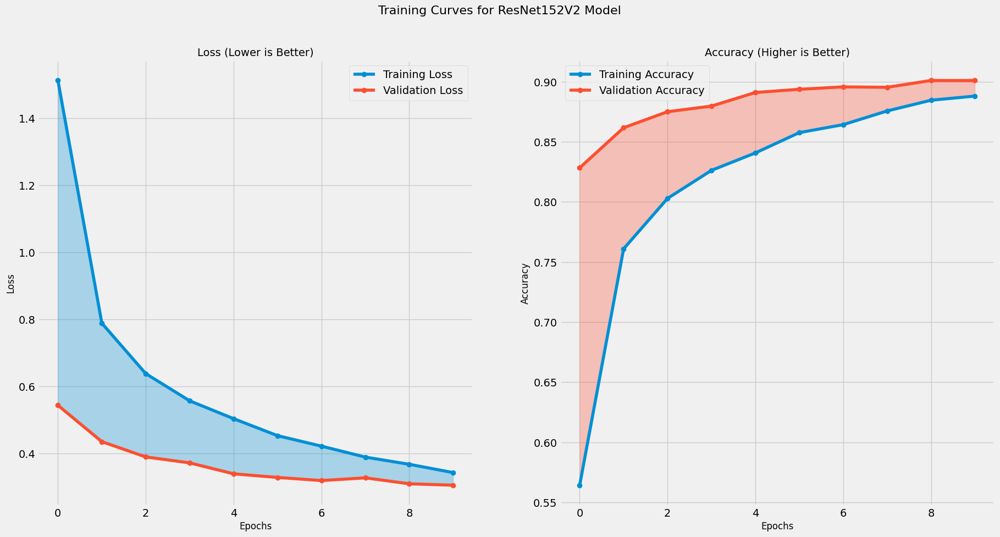

In [53]:

plot_training_curves(history, 'ResNet152V2 Model')


# 14. Training History Visualization

In [54]:
import matplotlib.pyplot as plt
import numpy as np

def plot_finetuning_performance(history, model_name="Fine-tuned Model"):
    tr_acc = history.history['accuracy']
    tr_loss = history.history['loss']
    val_acc = history.history['val_accuracy']
    val_loss = history.history['val_loss']

    index_loss = np.argmin(val_loss)
    val_lowest = val_loss[index_loss]

    index_acc = np.argmax(val_acc)
    acc_highest = val_acc[index_acc]

    epochs = [i + 1 for i in range(len(tr_acc))]
    loss_label = f'Best Epoch = {index_loss + 1}'
    acc_label = f'Best Epoch = {index_acc + 1}'

    plt.figure(figsize=(20, 8))
    plt.style.use('fivethirtyeight')

    
    plt.subplot(1, 2, 1)
    plt.plot(epochs, tr_loss, 'r', label='Training Loss')
    plt.plot(epochs, val_loss, 'g', label='Validation Loss')
    plt.scatter(index_loss + 1, val_lowest, s=150, c='blue', label=loss_label)
    plt.title(f'{model_name} - Loss Curve')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()


    plt.subplot(1, 2, 2)
    plt.plot(epochs, tr_acc, 'r', label='Training Accuracy')
    plt.plot(epochs, val_acc, 'g', label='Validation Accuracy')
    plt.scatter(index_acc + 1, acc_highest, s=150, c='blue', label=acc_label)
    plt.title(f'{model_name} - Accuracy Curve')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()

    plt.tight_layout()
    plt.show()


# 15. Training and Validation Curve Visualization for ResNet152V2 Model After Fine-Tuning

In [55]:
import matplotlib.pyplot as plt
import numpy as np

def plot_finetuning_curves(history_finetune, model_name):
    loss = np.array(history_finetune.history['loss'])
    val_loss = np.array(history_finetune.history['val_loss'])
    accuracy = np.array(history_finetune.history['accuracy'])
    val_accuracy = np.array(history_finetune.history['val_accuracy'])
    epochs = range(len(loss))

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
    fig.suptitle(f'Fine-Tuning Curves for {model_name}', fontsize=16)

    ax1.plot(epochs, loss, label='Training Loss', marker='o', color='blue')
    ax1.plot(epochs, val_loss, label='Validation Loss', marker='o', color='orange')
    ax1.set_title('Loss During Fine-Tuning', fontsize=14)
    ax1.set_xlabel('Epochs', fontsize=12)
    ax1.set_ylabel('Loss', fontsize=12)
    ax1.legend()
    ax1.grid(True)

    ax2.plot(epochs, accuracy, label='Training Accuracy', marker='o', color='green')
    ax2.plot(epochs, val_accuracy, label='Validation Accuracy', marker='o', color='red')
    ax2.set_title('Accuracy During Fine-Tuning', fontsize=14)
    ax2.set_xlabel('Epochs', fontsize=12)
    ax2.set_ylabel('Accuracy', fontsize=12)
    ax2.legend()
    ax2.grid(True)

    plt.tight_layout()
    plt.show()


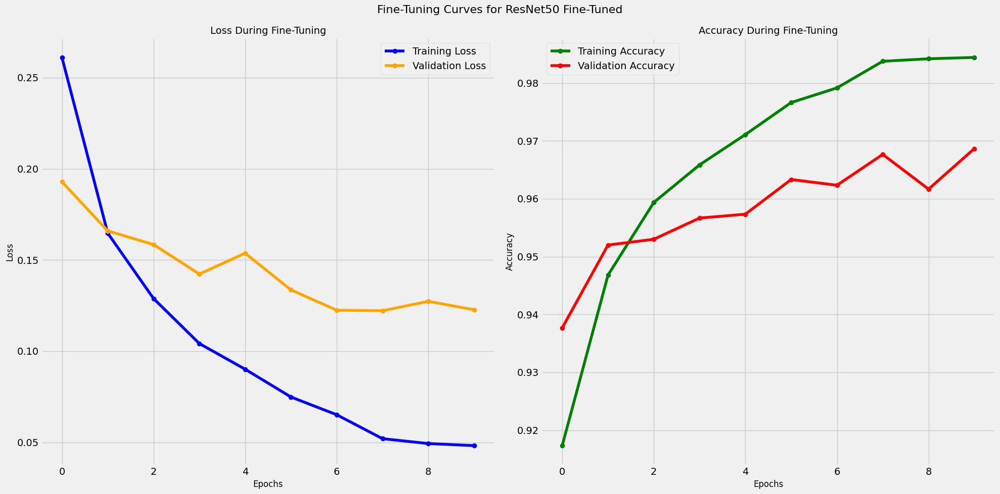

In [56]:
plot_finetuning_curves(history_finetune, "ResNet50 Fine-Tuned")

# 16. Visualization ROC and AUC Curves (Multiclass)

90/90 ━━━━━━━━━━━━━━━━━━━━ 34s 378ms/step


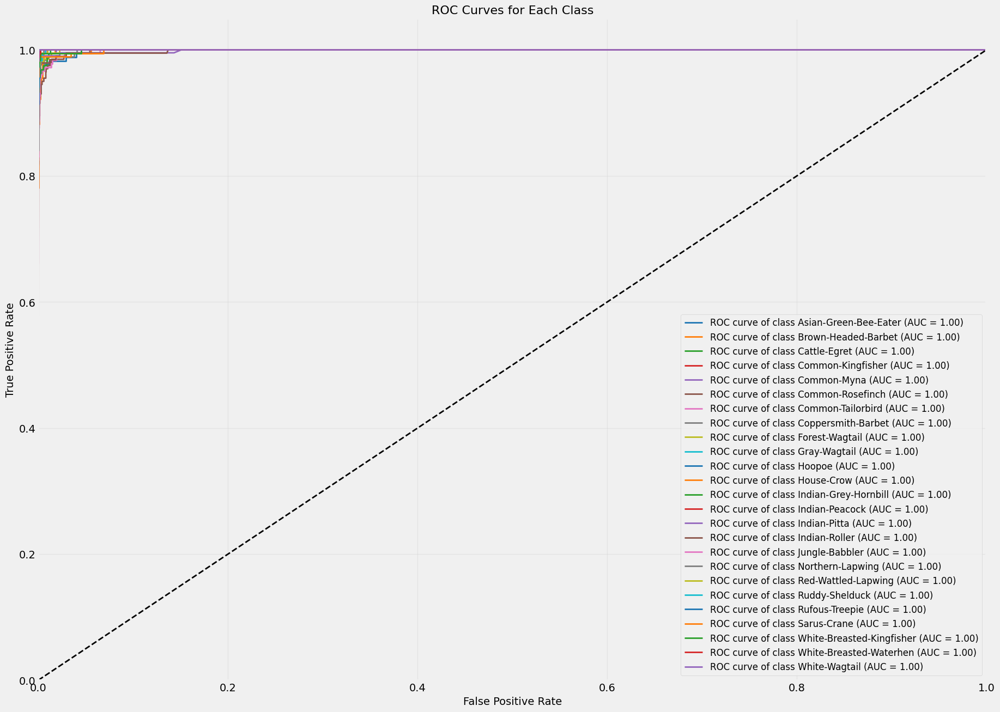

In [57]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize
from itertools import cycle


class_names = list(test_images.class_indices.keys())
n_classes = len(class_names)


y_true = test_images.classes
y_score = model.predict(test_images)
y_test = label_binarize(y_true, classes=range(n_classes))  


fpr = dict()
tpr = dict()
roc_auc = dict()

for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])


plt.figure(figsize=(20, 15))
colors = cycle(plt.cm.tab10.colors)  

for i, color in zip(range(n_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2,
             label=f'ROC curve of class {class_names[i]} (AUC = {roc_auc[i]:.2f})')

plt.plot([0, 1], [0, 1], 'k--', lw=2)  
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate', fontsize=14)
plt.ylabel('True Positive Rate', fontsize=14)
plt.title('ROC Curves for Each Class', fontsize=16)
plt.legend(loc='lower right', fontsize=12)
plt.grid(alpha=0.3)
plt.show()


# 17. Micro & Macro Average ROC Curve

In [58]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize
from sklearn.metrics import RocCurveDisplay
from numpy import interp
from itertools import cycle


class_names = list(test_images.class_indices.keys())
n_classes = len(class_names)


y_true = test_images.classes
y_score = model.predict(test_images)


y_test = label_binarize(y_true, classes=range(n_classes))


fpr = dict()
tpr = dict()
roc_auc = dict()

for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])


fpr["micro"], tpr["micro"], _ = roc_curve(y_test.ravel(), y_score.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])


all_fpr = np.unique(np.concatenate([fpr[i] for i in range(n_classes)]))


mean_tpr = np.zeros_like(all_fpr)
for i in range(n_classes):
    mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])

mean_tpr /= n_classes

fpr["macro"] = all_fpr
tpr["macro"] = mean_tpr
roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])


90/90 ━━━━━━━━━━━━━━━━━━━━ 34s 372ms/step


# 18. ROC Curve: Micro, Macro, Per Class

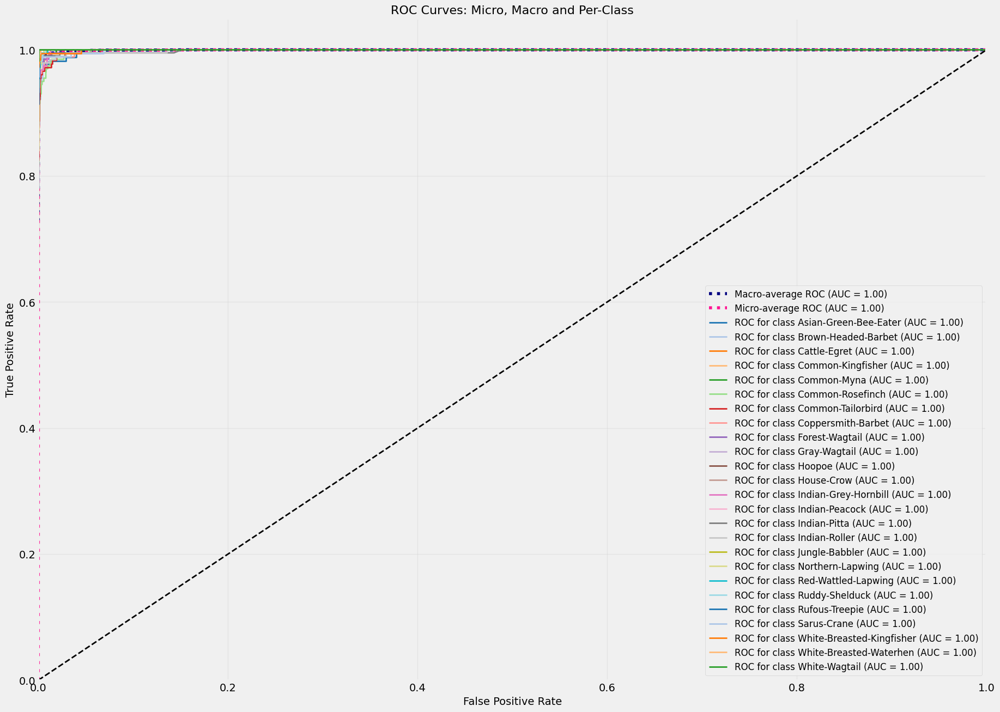

In [59]:

plt.figure(figsize=(20, 15))


plt.plot(fpr["macro"], tpr["macro"],
         label=f'Macro-average ROC (AUC = {roc_auc["macro"]:.2f})',
         color='navy', linestyle=':', linewidth=4)


plt.plot(fpr["micro"], tpr["micro"],
         label=f'Micro-average ROC (AUC = {roc_auc["micro"]:.2f})',
         color='deeppink', linestyle=':', linewidth=4)


colors = cycle(plt.cm.tab20.colors)
for i, color in zip(range(n_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2,
             label=f'ROC for class {class_names[i]} (AUC = {roc_auc[i]:.2f})')


plt.plot([0, 1], [0, 1], 'k--', lw=2)


plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate', fontsize=14)
plt.ylabel('True Positive Rate', fontsize=14)
plt.title('ROC Curves: Micro, Macro and Per-Class', fontsize=16)
plt.legend(loc='lower right', fontsize=12)
plt.grid(alpha=0.3)
plt.show()


**Improved results may be achived through ensembling techniques (such as blending, stacking or voting)**